# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

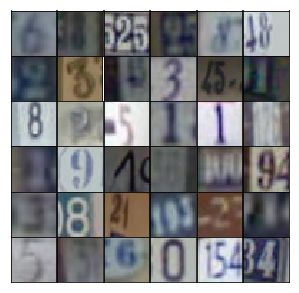

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. 
First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. 
We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [7]:
# Scale works the same as Tanh
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [8]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y
            #yield x, y

## Network Inputs

Here, just creating some placeholders like normal.

In [9]:
def model_inputs(input_dim):
    # Input data to the modal
    inputs = tf.placeholder(tf.float32, (None, *input_dim), name=None)
    
    # Indices/output/target/classes data to the model
    indices = tf.placeholder(tf.int32, (None), name=None)    
    
    return inputs, indices

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [10]:
# tf.layers.conv2d(
#     inputs, ----------
#     filters, -------------
#     kernel_size, ------------
#     strides=(1, 1), ---------------
#     padding='valid', ------------
#     data_format='channels_last', -------------> NHWC and not NCHW
#     dilation_rate=(1, 1), -------------------
#     activation=None,
#     use_bias=True, ------------------
#     kernel_initializer=None,
#     bias_initializer=tf.zeros_initializer(), ------------------
#     kernel_regularizer=None,
#     bias_regularizer=None,
#     activity_regularizer=None,
#     kernel_constraint=None,
#     bias_constraint=None,
#     trainable=True, ---------------------
#     name=None,
#     reuse=None
# )

In [25]:
# Qfunction or qfunction, q/Q is quality and this is used as a classifier or q-learning or q-network
def qfunction(inputs, output_dim, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('qfunction', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs=inputs, filters=64, kernel_size=5, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        # 16x16x64
        
        h2 = tf.layers.conv2d(inputs=nl1, filters=128, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        h3 = tf.layers.conv2d(inputs=nl2, filters=256, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it to the number of classes 
        # Let's imagine (4*4*512) is the number of classes.
        nl3_vec = tf.reshape(nl3, (-1, 4*4*256))
        #logits = tf.layers.dense(nl3_vec, 4*4*512)
        logits = tf.layers.dense(nl3_vec, output_dim) # this is for the classification task
        #predictions = tf.nn.softmax(logits)
        # 4x4x512 now
        
        return logits

In [26]:
def generator(inputs, output_dim, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # Reshape it to start the convolutional stack
        h1 = tf.layers.dense(inputs, 4*4*512)
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        nl1_mat = tf.reshape(nl1, (-1, 4, 4, 512))
        # 4x4x512 now
        
        h2 = tf.layers.conv2d_transpose(inputs=nl1_mat, filters=256, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x256 now
        
        h3 = tf.layers.conv2d_transpose(inputs=nl2, filters=128, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(inputs=nl3, filters=output_dim, kernel_size=5, strides=2, padding='same')        
        predictions = tf.tanh(logits) # inputs data is scaled!
        # 32x32x3 now

        # generated input or input fake
        return predictions

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [27]:
def discriminator(inputs, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs=inputs, filters=64, kernel_size=5, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        # 16x16x64
        
        h2 = tf.layers.conv2d(inputs=nl1, filters=128, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        h3 = tf.layers.conv2d(inputs=nl2, filters=256, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        nl3_vec = tf.reshape(nl3, (-1, 4*4*256))
        logits = tf.layers.dense(nl3_vec, 1)
        #predictions = tf.sigmoid(logits)
        
        return logits

## Model Loss

Calculating the loss like before, nothing new here.

In [28]:
# This is to determin the number of classes
trainset['y'].max(), trainset['y'].min()

(10, 1)

In [29]:
def model_loss(inputs_real, input_dim, indices_real, indices_dim):
    """
    Get the loss for the discriminator and generator
    :param inputs_real: Images from the real dataset
    :param output_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # Generating/reconstructing the fake inputs using real inputs
    q_logits = qfunction(inputs=inputs_real, output_dim=indices_dim)
    inputs_fake = generator(inputs=q_logits, output_dim=input_dim)
    #inputs_fake = g_logits

    # Qfunction loss using real and fake inputs
    # Reconstruction error
    # q_loss = tf.reduce_mean(tf.losses.mean_squared_error(predictions=input_fake, labels=input_real))
    q_loss_reconst = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=inputs_fake, labels=tf.sigmoid(inputs_real)))
    # Classification error
    q_loss_class = tf.reduce_mean(
        tf.nn.softmax_cross_entropy_with_logits_v2(logits=q_logits, 
                                                   labels=tf.one_hot(depth=indices_dim, indices=indices_real)))
    q_loss = q_loss_reconst + q_loss_class

    # Discriminator logits fake and real for G & D losses
    d_logits_fake = discriminator(inputs=inputs_fake, reuse=False)
    d_logits_real = discriminator(inputs=inputs_real, reuse=True)

    # Generator loss
    g_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.zeros_like(d_logits_real)))
    g_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_logits_fake)))
    g_loss = g_loss_real + g_loss_fake

    # Discriminator loss
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_logits_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    return q_loss, g_loss, d_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [30]:
def model_opt(q_loss, g_loss, d_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param q_loss: Qfunction loss Tensor
    :param g_loss: Generator loss Tensor
    :param d_loss: Discriminator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    q_vars = [var for var in t_vars if var.name.startswith('qfunction')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        q_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(q_loss, var_list=q_vars)
        g_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        d_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)

    return q_opt, g_opt, d_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [32]:
class GAN:
    def __init__(self, input_dim, indices_dim, learning_rate, beta1):
        tf.reset_default_graph()
        
        # Model inputs/data 
        self.inputs_real, self.indices_real = model_inputs(input_dim=input_dim)
        
        # Model losses/logits
        self.q_loss, self.g_loss, self.d_loss = model_loss(inputs_real=self.inputs_real, input_dim=input_dim[2], 
                                                           indices_real=self.indices_real, indices_dim=indices_dim)

        # Model update/optimization
        self.q_opt, self.g_opt, self.d_opt = model_opt(q_loss=self.q_loss, 
                                                       g_loss=self.g_loss, 
                                                       d_loss=self.d_loss, 
                                                       learning_rate=learning_rate, beta1=beta1)

Here is a function for displaying generated images.

In [33]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [56]:
def train(model, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    samples, losses = [], []
    steps = 0

    # Creating a session for training
    with tf.Session() as sess:
        
        # Initialize the model variable if there is no model available to load/restore
        sess.run(tf.global_variables_initializer())
        
        # Restore/load the trained model
        #saver.restore(sess, './checkpoints/Auto-DCGAN.ckpt')
        saver.restore(sess, tf.train.latest_checkpoint('checkpoints/'))
        
        # Number of epochs for updating the model/s
        for e in range(epochs):
            
            # Training batches
            for inputs_real, indices_real in dataset.batches(batch_size):
                steps += 1

                # Run optimizers
                feed_dict={model.inputs_real: inputs_real, model.indices_real: indices_real}
                _ = sess.run(model.q_opt, feed_dict)
                _ = sess.run(model.g_opt, feed_dict)
                _ = sess.run(model.d_opt, feed_dict)

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    q_loss = model.q_loss.eval(feed_dict)
                    g_loss = model.g_loss.eval(feed_dict)
                    d_loss = model.d_loss.eval(feed_dict)

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Qfunction Loss: {}".format(q_loss),
                          "Generator Loss: {}".format(g_loss),
                          "Discriminator Loss: {}".format(d_loss))
                    
                    # Save losses to view after training
                    losses.append((q_loss, g_loss, d_loss))

                if steps % show_every == 0:
                    model_qlogits = qfunction(inputs=model.inputs_real, output_dim=10, reuse=True, training=False)
                    model_glogits = generator(inputs=model_qlogits, output_dim=3, reuse=True, training=False)
                    reconst_inputs = sess.run(model_glogits, feed_dict)
                    samples.append(reconst_inputs)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        # Save the trained model
        saver.save(sess, './checkpoints/model.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [57]:
# ADAM default parameters
# __init__(
#     learning_rate=0.001,
#     beta1=0.9,
#     beta2=0.999,
#     epsilon=1e-08,
#     use_locking=False,
#     name='Adam'
# )

In [58]:
# Dataset for the model
dataset = Dataset(trainset, testset)

In [59]:
dataset.train_y.shape, dataset.train_y.max()

((73257, 1), 10)

In [60]:
image_size = (32,32,3)
num_classes = 10
learning_rate = 0.001
beta1 = 0.5
batch_size = 128
epochs = 10
alpha = 0.1

# Create the network
model = GAN(input_dim=image_size, indices_dim=num_classes, learning_rate=learning_rate, beta1=beta1)

INFO:tensorflow:Restoring parameters from checkpoints/model.ckpt
Epoch 1/10... Qfunction Loss: 2.866964817047119 Generator Loss: 7.3433122634887695 Discriminator Loss: 0.9805654287338257
Epoch 1/10... Qfunction Loss: 1.7976136207580566 Generator Loss: 6.944554805755615 Discriminator Loss: 0.20300044119358063
Epoch 1/10... Qfunction Loss: 3.1111531257629395 Generator Loss: 5.409458160400391 Discriminator Loss: 0.4432092607021332
Epoch 1/10... Qfunction Loss: 3.249960422515869 Generator Loss: 6.909704208374023 Discriminator Loss: 0.1615648865699768
Epoch 1/10... Qfunction Loss: 5.393970489501953 Generator Loss: 5.130648612976074 Discriminator Loss: 0.386936217546463
Epoch 1/10... Qfunction Loss: 3.0191242694854736 Generator Loss: 5.623710632324219 Discriminator Loss: 0.2553931176662445
Epoch 1/10... Qfunction Loss: 1.5162150859832764 Generator Loss: 7.612481117248535 Discriminator Loss: 0.28784695267677307
Epoch 1/10... Qfunction Loss: 1.6960442066192627 Generator Loss: 6.501036643981934

/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


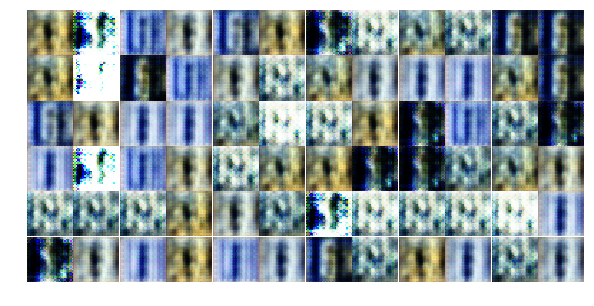

Epoch 1/10... Qfunction Loss: 2.4478063583374023 Generator Loss: 6.313855171203613 Discriminator Loss: 0.420889288187027
Epoch 1/10... Qfunction Loss: 4.40929651260376 Generator Loss: 6.641024589538574 Discriminator Loss: 0.31003743410110474
Epoch 1/10... Qfunction Loss: 2.7163243293762207 Generator Loss: 6.421597480773926 Discriminator Loss: 0.3842427134513855
Epoch 1/10... Qfunction Loss: 4.820542812347412 Generator Loss: 6.941625118255615 Discriminator Loss: 0.18757256865501404
Epoch 1/10... Qfunction Loss: 2.737212896347046 Generator Loss: 5.927523136138916 Discriminator Loss: 0.2057858556509018
Epoch 1/10... Qfunction Loss: 2.5437965393066406 Generator Loss: 7.081716537475586 Discriminator Loss: 0.1874087005853653
Epoch 1/10... Qfunction Loss: 2.6831018924713135 Generator Loss: 6.131650924682617 Discriminator Loss: 0.22988420724868774
Epoch 1/10... Qfunction Loss: 2.1791558265686035 Generator Loss: 7.189793586730957 Discriminator Loss: 0.8558246493339539
Epoch 1/10... Qfunction Lo

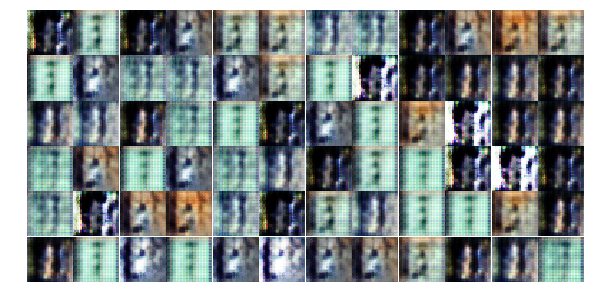

Epoch 1/10... Qfunction Loss: 2.7464563846588135 Generator Loss: 7.68001651763916 Discriminator Loss: 0.728474497795105
Epoch 1/10... Qfunction Loss: 2.761976480484009 Generator Loss: 7.085113525390625 Discriminator Loss: 0.18774622678756714
Epoch 1/10... Qfunction Loss: 2.4350645542144775 Generator Loss: 7.580989360809326 Discriminator Loss: 0.2778407335281372
Epoch 1/10... Qfunction Loss: 1.7481240034103394 Generator Loss: 5.949690818786621 Discriminator Loss: 0.28998446464538574
Epoch 1/10... Qfunction Loss: 2.584425449371338 Generator Loss: 6.247724533081055 Discriminator Loss: 0.32076841592788696
Epoch 1/10... Qfunction Loss: 4.915701389312744 Generator Loss: 8.492318153381348 Discriminator Loss: 1.3164445161819458
Epoch 1/10... Qfunction Loss: 4.013915538787842 Generator Loss: 7.207266330718994 Discriminator Loss: 0.9221625328063965
Epoch 1/10... Qfunction Loss: 3.85715913772583 Generator Loss: 6.565176963806152 Discriminator Loss: 0.18881440162658691
Epoch 1/10... Qfunction Loss

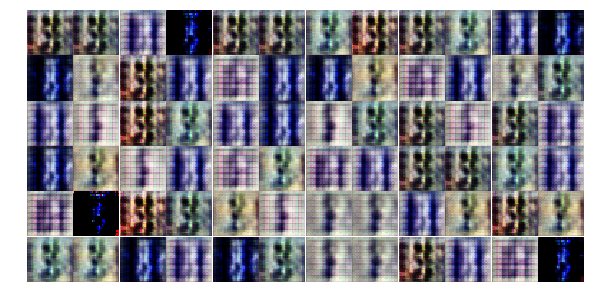

Epoch 1/10... Qfunction Loss: 6.4448771476745605 Generator Loss: 8.322450637817383 Discriminator Loss: 0.11553926765918732
Epoch 1/10... Qfunction Loss: 2.576582193374634 Generator Loss: 7.351678848266602 Discriminator Loss: 0.13266968727111816
Epoch 1/10... Qfunction Loss: 2.6639323234558105 Generator Loss: 9.010269165039062 Discriminator Loss: 0.07254898548126221
Epoch 1/10... Qfunction Loss: 1.428203821182251 Generator Loss: 8.69700813293457 Discriminator Loss: 0.13097304105758667
Epoch 1/10... Qfunction Loss: 3.5538411140441895 Generator Loss: 7.52017068862915 Discriminator Loss: 0.15598449110984802
Epoch 1/10... Qfunction Loss: 4.498079299926758 Generator Loss: 7.727417469024658 Discriminator Loss: 0.23967161774635315
Epoch 1/10... Qfunction Loss: 3.057316541671753 Generator Loss: 8.890730857849121 Discriminator Loss: 0.08385299146175385
Epoch 1/10... Qfunction Loss: 4.665932655334473 Generator Loss: 7.216731071472168 Discriminator Loss: 1.3963819742202759
Epoch 1/10... Qfunction 

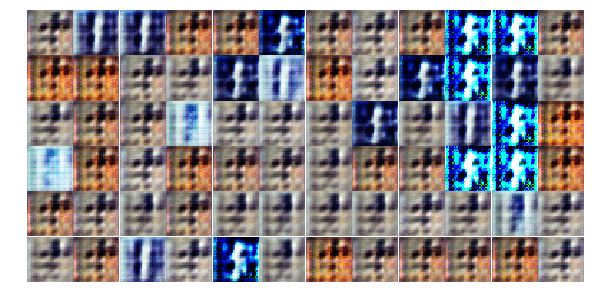

Epoch 1/10... Qfunction Loss: 2.7353827953338623 Generator Loss: 6.988518238067627 Discriminator Loss: 0.17065361142158508
Epoch 1/10... Qfunction Loss: 3.656837224960327 Generator Loss: 7.005451679229736 Discriminator Loss: 0.28592121601104736
Epoch 1/10... Qfunction Loss: 1.86110520362854 Generator Loss: 8.168344497680664 Discriminator Loss: 0.22301994264125824
Epoch 1/10... Qfunction Loss: 2.570509910583496 Generator Loss: 10.451300621032715 Discriminator Loss: 0.24771687388420105
Epoch 1/10... Qfunction Loss: 1.6104981899261475 Generator Loss: 6.780834197998047 Discriminator Loss: 0.386662095785141
Epoch 1/10... Qfunction Loss: 3.523728609085083 Generator Loss: 6.346845626831055 Discriminator Loss: 0.43025994300842285
Epoch 1/10... Qfunction Loss: 2.4081761837005615 Generator Loss: 6.477577209472656 Discriminator Loss: 0.40992987155914307
Epoch 1/10... Qfunction Loss: 3.1212944984436035 Generator Loss: 8.999557495117188 Discriminator Loss: 0.32995206117630005
Epoch 1/10... Qfunctio

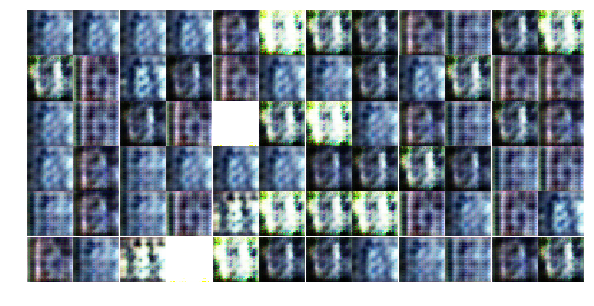

Epoch 1/10... Qfunction Loss: 5.216748237609863 Generator Loss: 7.386602401733398 Discriminator Loss: 0.27737143635749817
Epoch 1/10... Qfunction Loss: 3.8123159408569336 Generator Loss: 8.11900520324707 Discriminator Loss: 0.10422074049711227
Epoch 1/10... Qfunction Loss: 2.1812727451324463 Generator Loss: 6.070256233215332 Discriminator Loss: 0.46909797191619873
Epoch 1/10... Qfunction Loss: 3.3324661254882812 Generator Loss: 6.186001777648926 Discriminator Loss: 0.23671026527881622
Epoch 1/10... Qfunction Loss: 3.3226399421691895 Generator Loss: 7.600616455078125 Discriminator Loss: 0.31550219655036926
Epoch 1/10... Qfunction Loss: 2.57153582572937 Generator Loss: 6.778799533843994 Discriminator Loss: 0.2505519986152649
Epoch 1/10... Qfunction Loss: 3.8447158336639404 Generator Loss: 7.401703357696533 Discriminator Loss: 0.8797710537910461
Epoch 2/10... Qfunction Loss: 3.9828739166259766 Generator Loss: 6.402787208557129 Discriminator Loss: 0.2803836464881897
Epoch 2/10... Qfunction

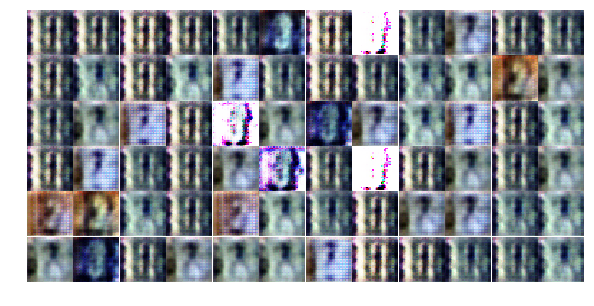

Epoch 2/10... Qfunction Loss: 3.6078972816467285 Generator Loss: 7.375818252563477 Discriminator Loss: 0.20275552570819855
Epoch 2/10... Qfunction Loss: 2.95652174949646 Generator Loss: 6.576297283172607 Discriminator Loss: 0.20901525020599365
Epoch 2/10... Qfunction Loss: 6.346146106719971 Generator Loss: 5.544788837432861 Discriminator Loss: 0.3573508858680725
Epoch 2/10... Qfunction Loss: 2.96482253074646 Generator Loss: 5.939716339111328 Discriminator Loss: 0.7074076533317566
Epoch 2/10... Qfunction Loss: 3.779078722000122 Generator Loss: 4.710256099700928 Discriminator Loss: 1.098417043685913
Epoch 2/10... Qfunction Loss: 2.557265043258667 Generator Loss: 6.508108139038086 Discriminator Loss: 0.19028951227664948
Epoch 2/10... Qfunction Loss: 3.132617712020874 Generator Loss: 6.858779430389404 Discriminator Loss: 0.2113962471485138
Epoch 2/10... Qfunction Loss: 3.864903688430786 Generator Loss: 8.402618408203125 Discriminator Loss: 0.12506043910980225
Epoch 2/10... Qfunction Loss: 

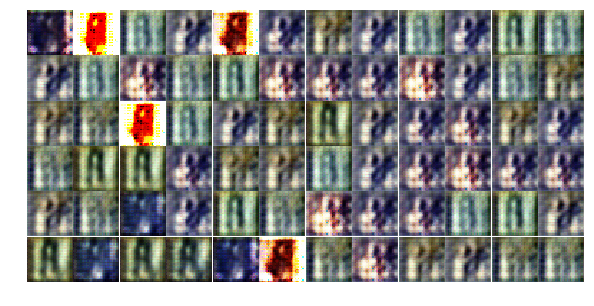

Epoch 2/10... Qfunction Loss: 3.9423866271972656 Generator Loss: 7.598697662353516 Discriminator Loss: 0.09920740127563477
Epoch 2/10... Qfunction Loss: 5.215040683746338 Generator Loss: 6.150493144989014 Discriminator Loss: 0.184840127825737
Epoch 2/10... Qfunction Loss: 4.248507499694824 Generator Loss: 5.60629415512085 Discriminator Loss: 0.46129539608955383
Epoch 2/10... Qfunction Loss: 4.4153971672058105 Generator Loss: 8.160028457641602 Discriminator Loss: 0.11670852452516556
Epoch 2/10... Qfunction Loss: 4.487856388092041 Generator Loss: 7.508625030517578 Discriminator Loss: 0.24005375802516937
Epoch 2/10... Qfunction Loss: 3.2735629081726074 Generator Loss: 6.651307106018066 Discriminator Loss: 0.3825554847717285
Epoch 2/10... Qfunction Loss: 1.9992022514343262 Generator Loss: 6.309148788452148 Discriminator Loss: 0.41593730449676514
Epoch 2/10... Qfunction Loss: 3.4434328079223633 Generator Loss: 6.718233108520508 Discriminator Loss: 0.2469024360179901
Epoch 2/10... Qfunction 

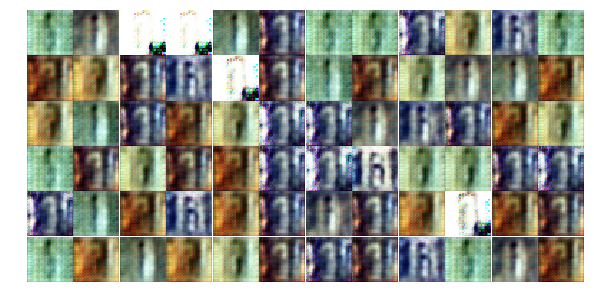

Epoch 2/10... Qfunction Loss: 2.910403251647949 Generator Loss: 5.051043510437012 Discriminator Loss: 0.5314252376556396
Epoch 2/10... Qfunction Loss: 5.282482147216797 Generator Loss: 5.512052536010742 Discriminator Loss: 0.24794715642929077
Epoch 2/10... Qfunction Loss: 4.323134422302246 Generator Loss: 6.572714805603027 Discriminator Loss: 0.2556530237197876
Epoch 2/10... Qfunction Loss: 2.8406217098236084 Generator Loss: 8.543424606323242 Discriminator Loss: 0.32624098658561707
Epoch 2/10... Qfunction Loss: 1.6311144828796387 Generator Loss: 7.504336357116699 Discriminator Loss: 0.16649489104747772
Epoch 2/10... Qfunction Loss: 4.006226062774658 Generator Loss: 6.823574066162109 Discriminator Loss: 0.22158342599868774
Epoch 2/10... Qfunction Loss: 2.647355318069458 Generator Loss: 6.546362400054932 Discriminator Loss: 0.3252318203449249
Epoch 2/10... Qfunction Loss: 4.167387008666992 Generator Loss: 7.34934663772583 Discriminator Loss: 0.20657408237457275
Epoch 2/10... Qfunction Lo

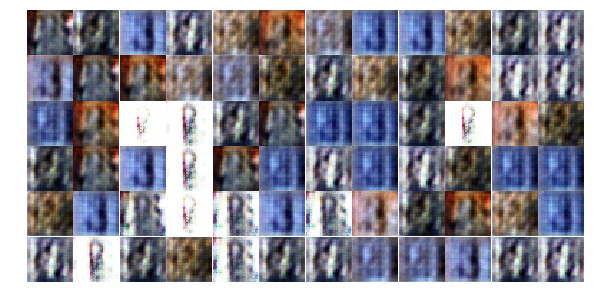

Epoch 2/10... Qfunction Loss: 4.578476905822754 Generator Loss: 7.055342674255371 Discriminator Loss: 0.23081707954406738
Epoch 2/10... Qfunction Loss: 4.499089241027832 Generator Loss: 7.020998954772949 Discriminator Loss: 0.24311000108718872
Epoch 2/10... Qfunction Loss: 1.7126905918121338 Generator Loss: 6.5752668380737305 Discriminator Loss: 0.1908293217420578
Epoch 2/10... Qfunction Loss: 3.1926844120025635 Generator Loss: 7.769455909729004 Discriminator Loss: 0.16421322524547577
Epoch 2/10... Qfunction Loss: 3.5424599647521973 Generator Loss: 5.633315086364746 Discriminator Loss: 0.24110165238380432
Epoch 2/10... Qfunction Loss: 3.0178515911102295 Generator Loss: 8.55908203125 Discriminator Loss: 0.07714468985795975
Epoch 2/10... Qfunction Loss: 2.1120991706848145 Generator Loss: 7.872584342956543 Discriminator Loss: 0.14199790358543396
Epoch 2/10... Qfunction Loss: 2.86669659614563 Generator Loss: 7.7519941329956055 Discriminator Loss: 0.34658220410346985
Epoch 2/10... Qfunction

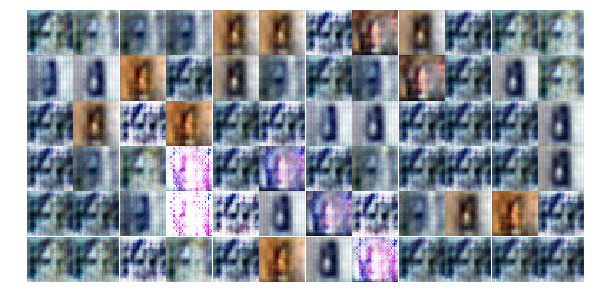

Epoch 2/10... Qfunction Loss: 4.698734760284424 Generator Loss: 7.457258224487305 Discriminator Loss: 0.15858756005764008
Epoch 2/10... Qfunction Loss: 7.017359256744385 Generator Loss: 9.097887992858887 Discriminator Loss: 0.6184293627738953
Epoch 2/10... Qfunction Loss: 7.03638219833374 Generator Loss: 6.295499801635742 Discriminator Loss: 0.2917296886444092
Epoch 2/10... Qfunction Loss: 3.160681962966919 Generator Loss: 9.29219913482666 Discriminator Loss: 0.727803111076355
Epoch 2/10... Qfunction Loss: 3.9688150882720947 Generator Loss: 5.998290061950684 Discriminator Loss: 0.3334713280200958
Epoch 2/10... Qfunction Loss: 5.1990227699279785 Generator Loss: 7.334602355957031 Discriminator Loss: 0.6058001518249512
Epoch 2/10... Qfunction Loss: 5.735400199890137 Generator Loss: 8.031471252441406 Discriminator Loss: 0.3662192225456238
Epoch 2/10... Qfunction Loss: 4.717518329620361 Generator Loss: 7.274042129516602 Discriminator Loss: 0.6641165614128113
Epoch 2/10... Qfunction Loss: 4.

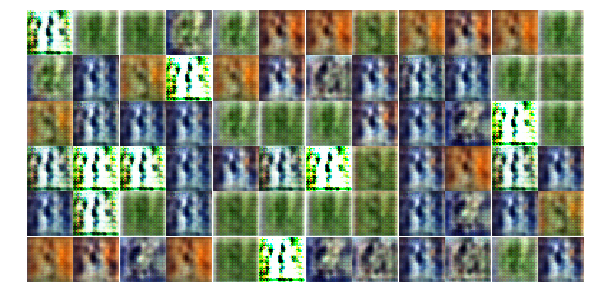

Epoch 2/10... Qfunction Loss: 4.401994228363037 Generator Loss: 7.189765453338623 Discriminator Loss: 0.7646435499191284
Epoch 2/10... Qfunction Loss: 2.42008113861084 Generator Loss: 8.410175323486328 Discriminator Loss: 0.1303536742925644
Epoch 2/10... Qfunction Loss: 6.59222412109375 Generator Loss: 2.228410243988037 Discriminator Loss: 1.350603461265564
Epoch 2/10... Qfunction Loss: 5.916055202484131 Generator Loss: 7.486273765563965 Discriminator Loss: 0.5289691686630249
Epoch 3/10... Qfunction Loss: 4.534802436828613 Generator Loss: 7.850751876831055 Discriminator Loss: 0.3930683732032776
Epoch 3/10... Qfunction Loss: 2.6326663494110107 Generator Loss: 7.012171745300293 Discriminator Loss: 0.15203014016151428
Epoch 3/10... Qfunction Loss: 3.0425429344177246 Generator Loss: 8.809823989868164 Discriminator Loss: 0.9948707222938538
Epoch 3/10... Qfunction Loss: 2.8390707969665527 Generator Loss: 6.900996208190918 Discriminator Loss: 1.2138638496398926
Epoch 3/10... Qfunction Loss: 3

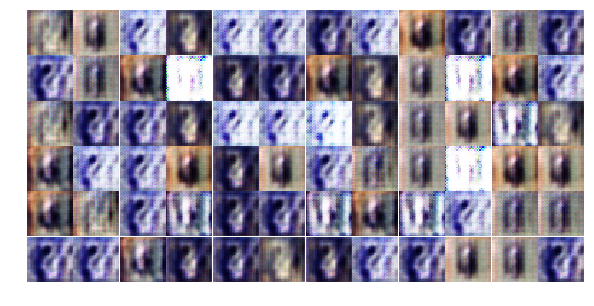

Epoch 3/10... Qfunction Loss: 4.537397384643555 Generator Loss: 6.624999046325684 Discriminator Loss: 0.33419907093048096
Epoch 3/10... Qfunction Loss: 4.206539154052734 Generator Loss: 8.043663024902344 Discriminator Loss: 0.5370239019393921
Epoch 3/10... Qfunction Loss: 4.009807109832764 Generator Loss: 7.075675010681152 Discriminator Loss: 0.15543220937252045
Epoch 3/10... Qfunction Loss: 3.3218021392822266 Generator Loss: 6.149894714355469 Discriminator Loss: 0.32163164019584656
Epoch 3/10... Qfunction Loss: 5.981897354125977 Generator Loss: 7.703327655792236 Discriminator Loss: 0.2543638050556183
Epoch 3/10... Qfunction Loss: 4.837371826171875 Generator Loss: 7.714879989624023 Discriminator Loss: 0.10292401909828186
Epoch 3/10... Qfunction Loss: 4.964719295501709 Generator Loss: 9.454134941101074 Discriminator Loss: 0.06602463871240616
Epoch 3/10... Qfunction Loss: 6.040985584259033 Generator Loss: 6.97463846206665 Discriminator Loss: 0.13317428529262543
Epoch 3/10... Qfunction Lo

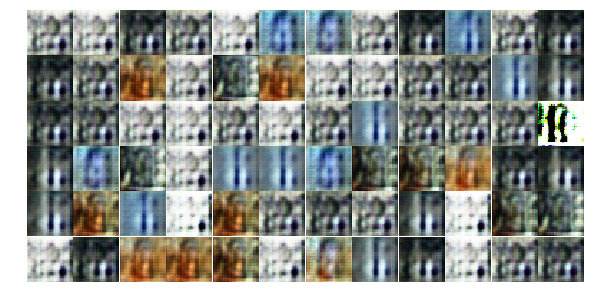

Epoch 3/10... Qfunction Loss: 3.097226858139038 Generator Loss: 6.195765495300293 Discriminator Loss: 0.2555598020553589
Epoch 3/10... Qfunction Loss: 4.470650672912598 Generator Loss: 6.064560890197754 Discriminator Loss: 0.2032356560230255
Epoch 3/10... Qfunction Loss: 3.0316553115844727 Generator Loss: 7.4048309326171875 Discriminator Loss: 0.19979509711265564
Epoch 3/10... Qfunction Loss: 3.6353626251220703 Generator Loss: 5.560769557952881 Discriminator Loss: 0.46542292833328247
Epoch 3/10... Qfunction Loss: 2.921814441680908 Generator Loss: 7.268389701843262 Discriminator Loss: 0.18882736563682556
Epoch 3/10... Qfunction Loss: 4.271951675415039 Generator Loss: 5.8497443199157715 Discriminator Loss: 0.3716234564781189
Epoch 3/10... Qfunction Loss: 2.497999906539917 Generator Loss: 7.150756359100342 Discriminator Loss: 0.1762772500514984
Epoch 3/10... Qfunction Loss: 4.196706295013428 Generator Loss: 5.430330276489258 Discriminator Loss: 0.28234773874282837
Epoch 3/10... Qfunction 

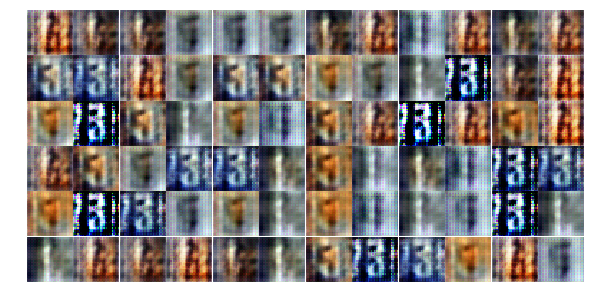

Epoch 3/10... Qfunction Loss: 2.4587504863739014 Generator Loss: 4.604406833648682 Discriminator Loss: 0.39659273624420166
Epoch 3/10... Qfunction Loss: 3.8951666355133057 Generator Loss: 6.319615364074707 Discriminator Loss: 0.2415149062871933
Epoch 3/10... Qfunction Loss: 4.743985176086426 Generator Loss: 6.552622318267822 Discriminator Loss: 0.25213563442230225
Epoch 3/10... Qfunction Loss: 3.7341537475585938 Generator Loss: 6.9608330726623535 Discriminator Loss: 0.20113340020179749
Epoch 3/10... Qfunction Loss: 5.861990451812744 Generator Loss: 6.822905540466309 Discriminator Loss: 0.3658924102783203
Epoch 3/10... Qfunction Loss: 6.154897212982178 Generator Loss: 6.406369209289551 Discriminator Loss: 0.2050257921218872
Epoch 3/10... Qfunction Loss: 5.659178256988525 Generator Loss: 8.155872344970703 Discriminator Loss: 0.08117939531803131
Epoch 3/10... Qfunction Loss: 3.983309030532837 Generator Loss: 7.3856916427612305 Discriminator Loss: 0.5954594016075134
Epoch 3/10... Qfunction

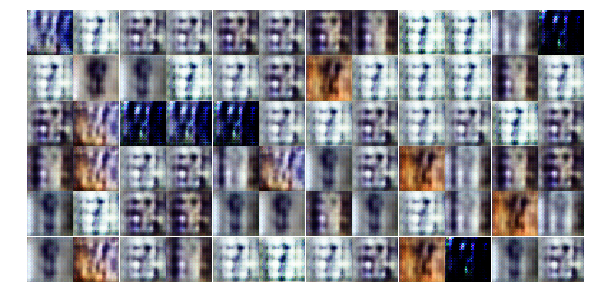

Epoch 3/10... Qfunction Loss: 5.446835994720459 Generator Loss: 7.342918872833252 Discriminator Loss: 0.19704793393611908
Epoch 3/10... Qfunction Loss: 3.320566415786743 Generator Loss: 6.535603046417236 Discriminator Loss: 0.2668989300727844
Epoch 3/10... Qfunction Loss: 2.504024028778076 Generator Loss: 7.311887741088867 Discriminator Loss: 0.18933026492595673
Epoch 3/10... Qfunction Loss: 2.323742151260376 Generator Loss: 8.325328826904297 Discriminator Loss: 0.14008018374443054
Epoch 3/10... Qfunction Loss: 6.238407611846924 Generator Loss: 7.564026832580566 Discriminator Loss: 0.2116035521030426
Epoch 3/10... Qfunction Loss: 3.675774335861206 Generator Loss: 8.225815773010254 Discriminator Loss: 0.6020253896713257
Epoch 3/10... Qfunction Loss: 4.109423637390137 Generator Loss: 7.21685791015625 Discriminator Loss: 0.44527387619018555
Epoch 3/10... Qfunction Loss: 2.954366683959961 Generator Loss: 6.662632942199707 Discriminator Loss: 0.7108704447746277
Epoch 3/10... Qfunction Loss:

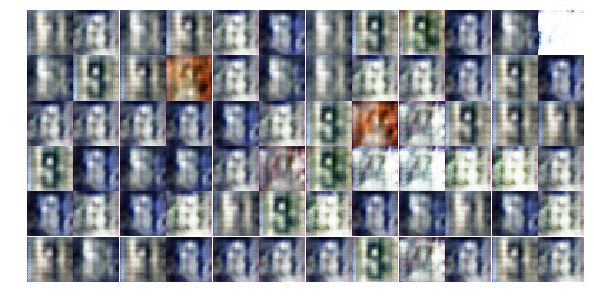

Epoch 3/10... Qfunction Loss: 2.561020851135254 Generator Loss: 7.2685980796813965 Discriminator Loss: 0.28103360533714294
Epoch 3/10... Qfunction Loss: 6.780201435089111 Generator Loss: 6.753741264343262 Discriminator Loss: 0.2576577067375183
Epoch 3/10... Qfunction Loss: 3.6078710556030273 Generator Loss: 6.115387916564941 Discriminator Loss: 0.3134320378303528
Epoch 3/10... Qfunction Loss: 2.7631022930145264 Generator Loss: 8.035353660583496 Discriminator Loss: 0.12938717007637024
Epoch 3/10... Qfunction Loss: 5.764982223510742 Generator Loss: 7.601572036743164 Discriminator Loss: 0.13395929336547852
Epoch 3/10... Qfunction Loss: 4.548470973968506 Generator Loss: 9.391739845275879 Discriminator Loss: 0.1713457852602005
Epoch 3/10... Qfunction Loss: 4.168311595916748 Generator Loss: 8.336009979248047 Discriminator Loss: 0.31940263509750366
Epoch 3/10... Qfunction Loss: 2.9296462535858154 Generator Loss: 8.71458911895752 Discriminator Loss: 0.2713022232055664
Epoch 3/10... Qfunction L

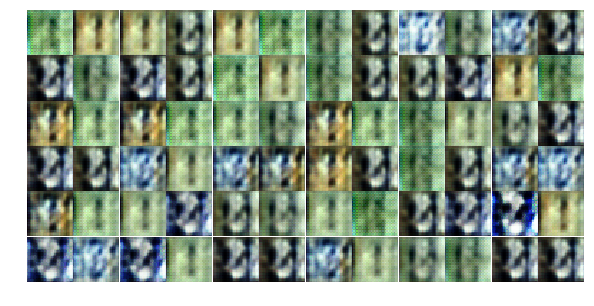

Epoch 3/10... Qfunction Loss: 3.3195464611053467 Generator Loss: 8.660825729370117 Discriminator Loss: 0.17575803399085999
Epoch 4/10... Qfunction Loss: 3.7534823417663574 Generator Loss: 8.34143352508545 Discriminator Loss: 0.44387754797935486
Epoch 4/10... Qfunction Loss: 6.844537258148193 Generator Loss: 9.047296524047852 Discriminator Loss: 0.3815677762031555
Epoch 4/10... Qfunction Loss: 5.714299201965332 Generator Loss: 7.659934997558594 Discriminator Loss: 0.1955566108226776
Epoch 4/10... Qfunction Loss: 5.250678062438965 Generator Loss: 8.731855392456055 Discriminator Loss: 0.07571960985660553
Epoch 4/10... Qfunction Loss: 3.94533371925354 Generator Loss: 6.802445888519287 Discriminator Loss: 0.2028891146183014
Epoch 4/10... Qfunction Loss: 6.336832523345947 Generator Loss: 7.464130401611328 Discriminator Loss: 0.14542722702026367
Epoch 4/10... Qfunction Loss: 4.117770195007324 Generator Loss: 8.009018898010254 Discriminator Loss: 0.1236836314201355
Epoch 4/10... Qfunction Loss

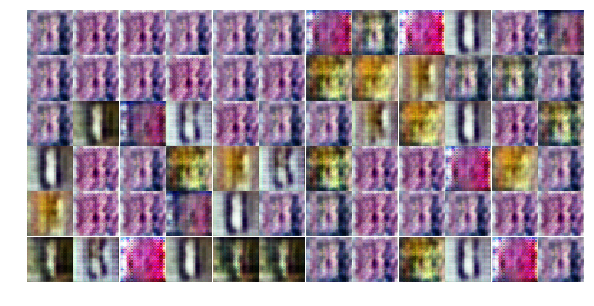

Epoch 4/10... Qfunction Loss: 7.126489639282227 Generator Loss: 5.456478118896484 Discriminator Loss: 0.36083489656448364
Epoch 4/10... Qfunction Loss: 8.871182441711426 Generator Loss: 7.298458099365234 Discriminator Loss: 0.2088162899017334
Epoch 4/10... Qfunction Loss: 3.4857687950134277 Generator Loss: 5.880370140075684 Discriminator Loss: 0.28534746170043945
Epoch 4/10... Qfunction Loss: 4.282380104064941 Generator Loss: 5.780291557312012 Discriminator Loss: 0.2306610345840454
Epoch 4/10... Qfunction Loss: 6.485785484313965 Generator Loss: 7.403041839599609 Discriminator Loss: 0.4038172662258148
Epoch 4/10... Qfunction Loss: 5.51118803024292 Generator Loss: 5.785297393798828 Discriminator Loss: 0.21136322617530823
Epoch 4/10... Qfunction Loss: 3.7524027824401855 Generator Loss: 6.924269676208496 Discriminator Loss: 0.14766326546669006
Epoch 4/10... Qfunction Loss: 5.669569492340088 Generator Loss: 7.664371490478516 Discriminator Loss: 1.3720648288726807
Epoch 4/10... Qfunction Los

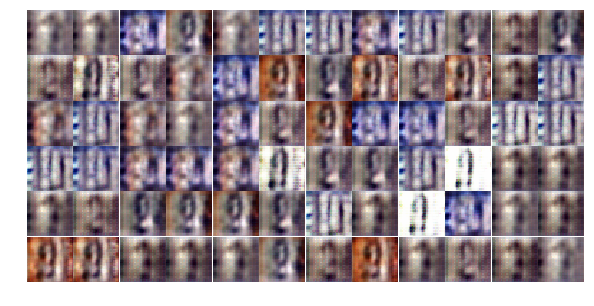

Epoch 4/10... Qfunction Loss: 2.587941884994507 Generator Loss: 5.8734846115112305 Discriminator Loss: 0.3762029707431793
Epoch 4/10... Qfunction Loss: 3.5772416591644287 Generator Loss: 7.858434677124023 Discriminator Loss: 0.1251644641160965
Epoch 4/10... Qfunction Loss: 4.739567279815674 Generator Loss: 10.057388305664062 Discriminator Loss: 0.08222430944442749
Epoch 4/10... Qfunction Loss: 4.027869701385498 Generator Loss: 8.146382331848145 Discriminator Loss: 0.1666835993528366
Epoch 4/10... Qfunction Loss: 3.799525737762451 Generator Loss: 7.73125696182251 Discriminator Loss: 0.25894516706466675
Epoch 4/10... Qfunction Loss: 4.388350009918213 Generator Loss: 8.136249542236328 Discriminator Loss: 0.24762701988220215
Epoch 4/10... Qfunction Loss: 7.372295379638672 Generator Loss: 8.67140007019043 Discriminator Loss: 0.09501681476831436
Epoch 4/10... Qfunction Loss: 2.5424466133117676 Generator Loss: 9.714862823486328 Discriminator Loss: 0.1417074054479599
Epoch 4/10... Qfunction Lo

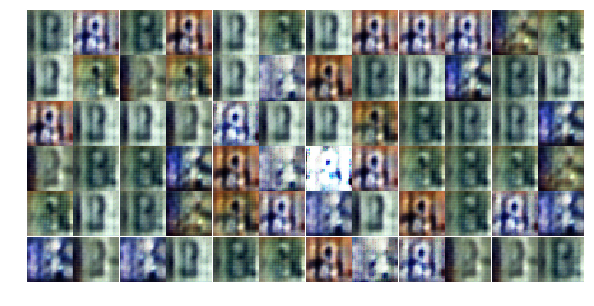

Epoch 4/10... Qfunction Loss: 4.835385322570801 Generator Loss: 5.704455375671387 Discriminator Loss: 0.30097728967666626
Epoch 4/10... Qfunction Loss: 2.5281944274902344 Generator Loss: 6.430689811706543 Discriminator Loss: 0.21722090244293213
Epoch 4/10... Qfunction Loss: 6.793039798736572 Generator Loss: 7.604001998901367 Discriminator Loss: 0.16117146611213684
Epoch 4/10... Qfunction Loss: 4.382250785827637 Generator Loss: 8.469467163085938 Discriminator Loss: 0.315731018781662
Epoch 4/10... Qfunction Loss: 4.092335224151611 Generator Loss: 9.154569625854492 Discriminator Loss: 0.06777899712324142
Epoch 4/10... Qfunction Loss: 3.4575693607330322 Generator Loss: 8.349459648132324 Discriminator Loss: 0.20842644572257996
Epoch 4/10... Qfunction Loss: 12.897171020507812 Generator Loss: 6.603835582733154 Discriminator Loss: 0.2307255119085312
Epoch 4/10... Qfunction Loss: 4.356292247772217 Generator Loss: 7.6229143142700195 Discriminator Loss: 0.35526421666145325
Epoch 4/10... Qfunction

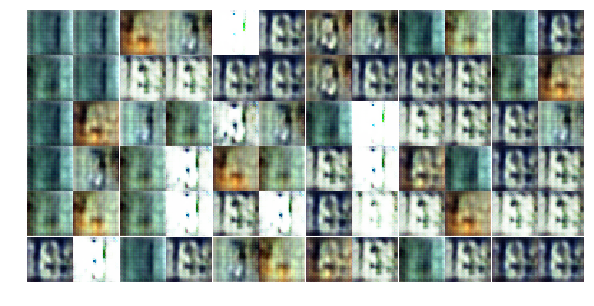

Epoch 4/10... Qfunction Loss: 4.525167465209961 Generator Loss: 8.20822811126709 Discriminator Loss: 0.14086297154426575
Epoch 4/10... Qfunction Loss: 6.873122692108154 Generator Loss: 6.288256645202637 Discriminator Loss: 0.3123786747455597
Epoch 4/10... Qfunction Loss: 2.8412411212921143 Generator Loss: 7.866373538970947 Discriminator Loss: 0.3683415949344635
Epoch 4/10... Qfunction Loss: 2.81441068649292 Generator Loss: 7.504467487335205 Discriminator Loss: 0.21627739071846008
Epoch 4/10... Qfunction Loss: 2.6989333629608154 Generator Loss: 9.474103927612305 Discriminator Loss: 0.06020133197307587
Epoch 4/10... Qfunction Loss: 7.333877086639404 Generator Loss: 6.927369117736816 Discriminator Loss: 0.4566612243652344
Epoch 4/10... Qfunction Loss: 3.1378495693206787 Generator Loss: 6.299379825592041 Discriminator Loss: 0.5065914392471313
Epoch 4/10... Qfunction Loss: 8.114789962768555 Generator Loss: 7.114475250244141 Discriminator Loss: 0.19102148711681366
Epoch 4/10... Qfunction Los

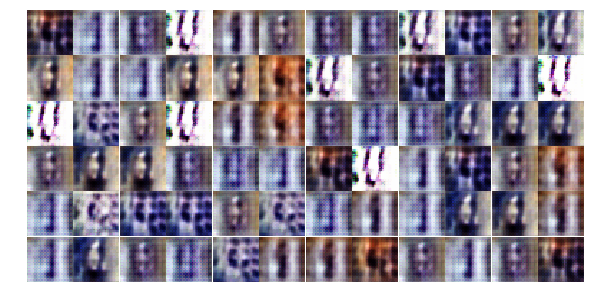

Epoch 4/10... Qfunction Loss: 4.563541412353516 Generator Loss: 8.827279090881348 Discriminator Loss: 0.07499941438436508
Epoch 4/10... Qfunction Loss: 6.8734540939331055 Generator Loss: 7.094600677490234 Discriminator Loss: 0.18693628907203674
Epoch 4/10... Qfunction Loss: 3.068927526473999 Generator Loss: 6.562376499176025 Discriminator Loss: 0.2791701853275299
Epoch 4/10... Qfunction Loss: 3.171938896179199 Generator Loss: 7.911524772644043 Discriminator Loss: 0.12639503180980682
Epoch 4/10... Qfunction Loss: 4.212376117706299 Generator Loss: 10.091789245605469 Discriminator Loss: 0.07359033077955246
Epoch 4/10... Qfunction Loss: 3.7485482692718506 Generator Loss: 9.491081237792969 Discriminator Loss: 0.5125006437301636
Epoch 4/10... Qfunction Loss: 6.777004241943359 Generator Loss: 6.778134346008301 Discriminator Loss: 0.22214768826961517
Epoch 4/10... Qfunction Loss: 4.308818340301514 Generator Loss: 7.903191566467285 Discriminator Loss: 0.11432068049907684
Epoch 4/10... Qfunction

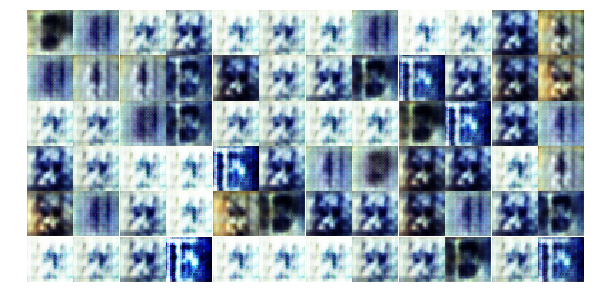

Epoch 5/10... Qfunction Loss: 3.508504867553711 Generator Loss: 8.041424751281738 Discriminator Loss: 0.20268972218036652
Epoch 5/10... Qfunction Loss: 5.537070274353027 Generator Loss: 8.526254653930664 Discriminator Loss: 0.46458616852760315
Epoch 5/10... Qfunction Loss: 6.837933540344238 Generator Loss: 8.849737167358398 Discriminator Loss: 0.09440039098262787
Epoch 5/10... Qfunction Loss: 9.034947395324707 Generator Loss: 9.680192947387695 Discriminator Loss: 0.041074786335229874
Epoch 5/10... Qfunction Loss: 4.316608428955078 Generator Loss: 9.267297744750977 Discriminator Loss: 0.09228254854679108
Epoch 5/10... Qfunction Loss: 8.463418006896973 Generator Loss: 7.032867431640625 Discriminator Loss: 0.14744053781032562
Epoch 5/10... Qfunction Loss: 3.47052001953125 Generator Loss: 7.520438194274902 Discriminator Loss: 0.25156983733177185
Epoch 5/10... Qfunction Loss: 4.48945426940918 Generator Loss: 9.53437614440918 Discriminator Loss: 0.1121237725019455
Epoch 5/10... Qfunction Los

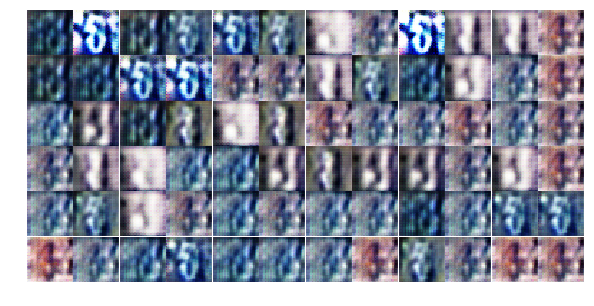

Epoch 5/10... Qfunction Loss: 3.484513282775879 Generator Loss: 7.564294815063477 Discriminator Loss: 0.12278478592634201
Epoch 5/10... Qfunction Loss: 7.272768974304199 Generator Loss: 9.339354515075684 Discriminator Loss: 0.19519631564617157
Epoch 5/10... Qfunction Loss: 5.15386962890625 Generator Loss: 8.149208068847656 Discriminator Loss: 0.2330935299396515
Epoch 5/10... Qfunction Loss: 5.538745880126953 Generator Loss: 8.836891174316406 Discriminator Loss: 0.0970982164144516
Epoch 5/10... Qfunction Loss: 7.881678581237793 Generator Loss: 8.321773529052734 Discriminator Loss: 0.12874652445316315
Epoch 5/10... Qfunction Loss: 5.557763576507568 Generator Loss: 7.6208953857421875 Discriminator Loss: 0.11301927268505096
Epoch 5/10... Qfunction Loss: 3.835624933242798 Generator Loss: 7.582451820373535 Discriminator Loss: 0.13403068482875824
Epoch 5/10... Qfunction Loss: 7.277318477630615 Generator Loss: 7.492303371429443 Discriminator Loss: 0.2023618370294571
Epoch 5/10... Qfunction Los

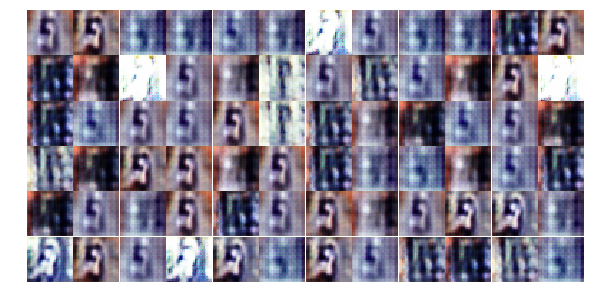

Epoch 5/10... Qfunction Loss: 3.054727077484131 Generator Loss: 9.73828125 Discriminator Loss: 0.06204643100500107
Epoch 5/10... Qfunction Loss: 6.138605117797852 Generator Loss: 7.905106067657471 Discriminator Loss: 0.10366883873939514
Epoch 5/10... Qfunction Loss: 6.825931072235107 Generator Loss: 9.260894775390625 Discriminator Loss: 0.13418738543987274
Epoch 5/10... Qfunction Loss: 6.3721137046813965 Generator Loss: 8.87886905670166 Discriminator Loss: 0.30794960260391235
Epoch 5/10... Qfunction Loss: 4.779783248901367 Generator Loss: 8.753442764282227 Discriminator Loss: 0.12775593996047974
Epoch 5/10... Qfunction Loss: 3.323472738265991 Generator Loss: 9.331121444702148 Discriminator Loss: 0.26950329542160034
Epoch 5/10... Qfunction Loss: 5.232229232788086 Generator Loss: 7.044472694396973 Discriminator Loss: 0.42981576919555664
Epoch 5/10... Qfunction Loss: 7.592820644378662 Generator Loss: 8.928661346435547 Discriminator Loss: 0.0678136795759201
Epoch 5/10... Qfunction Loss: 4.

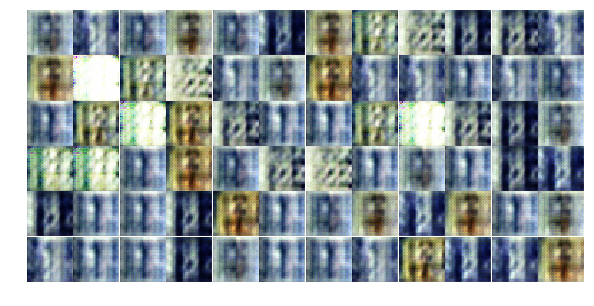

Epoch 5/10... Qfunction Loss: 9.143136978149414 Generator Loss: 7.1842875480651855 Discriminator Loss: 0.14317572116851807
Epoch 5/10... Qfunction Loss: 8.130476951599121 Generator Loss: 9.538344383239746 Discriminator Loss: 0.10183999687433243
Epoch 5/10... Qfunction Loss: 3.026306390762329 Generator Loss: 8.745257377624512 Discriminator Loss: 0.07611061632633209
Epoch 5/10... Qfunction Loss: 6.428016185760498 Generator Loss: 8.851970672607422 Discriminator Loss: 0.10596070438623428
Epoch 5/10... Qfunction Loss: 9.060981750488281 Generator Loss: 7.960504531860352 Discriminator Loss: 0.19519969820976257
Epoch 5/10... Qfunction Loss: 2.6374523639678955 Generator Loss: 6.902766227722168 Discriminator Loss: 0.2337218075990677
Epoch 5/10... Qfunction Loss: 3.0538883209228516 Generator Loss: 8.16568660736084 Discriminator Loss: 0.22593170404434204
Epoch 5/10... Qfunction Loss: 11.191488265991211 Generator Loss: 8.787528991699219 Discriminator Loss: 0.10044585913419724
Epoch 5/10... Qfunctio

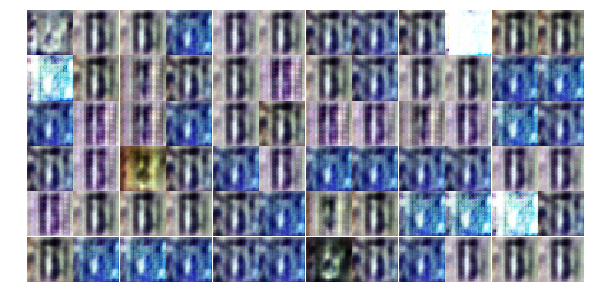

Epoch 5/10... Qfunction Loss: 3.925312042236328 Generator Loss: 8.0985107421875 Discriminator Loss: 0.1906624287366867
Epoch 5/10... Qfunction Loss: 8.602746963500977 Generator Loss: 8.916221618652344 Discriminator Loss: 0.3281930387020111
Epoch 5/10... Qfunction Loss: 10.683537483215332 Generator Loss: 6.310103416442871 Discriminator Loss: 1.128060221672058
Epoch 5/10... Qfunction Loss: 3.658959150314331 Generator Loss: 9.283918380737305 Discriminator Loss: 0.26074475049972534
Epoch 5/10... Qfunction Loss: 5.591166973114014 Generator Loss: 7.822421550750732 Discriminator Loss: 0.2020799070596695
Epoch 5/10... Qfunction Loss: 9.71154499053955 Generator Loss: 7.187923431396484 Discriminator Loss: 0.7833184599876404
Epoch 5/10... Qfunction Loss: 6.017949104309082 Generator Loss: 6.708600997924805 Discriminator Loss: 0.2145949900150299
Epoch 5/10... Qfunction Loss: 8.32405948638916 Generator Loss: 8.401397705078125 Discriminator Loss: 0.6673001646995544
Epoch 5/10... Qfunction Loss: 4.498

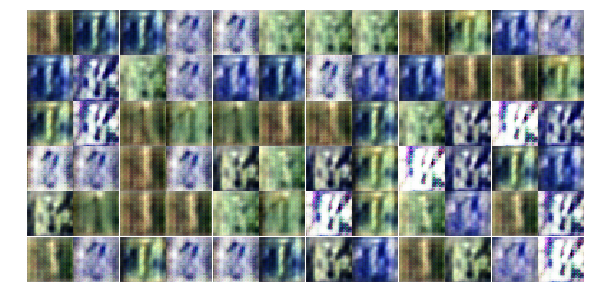

Epoch 5/10... Qfunction Loss: 2.1971118450164795 Generator Loss: 6.825503826141357 Discriminator Loss: 0.19791105389595032
Epoch 5/10... Qfunction Loss: 7.018086910247803 Generator Loss: 9.355400085449219 Discriminator Loss: 1.0764832496643066
Epoch 5/10... Qfunction Loss: 1.9957916736602783 Generator Loss: 7.289605617523193 Discriminator Loss: 0.13696539402008057
Epoch 5/10... Qfunction Loss: 6.792179107666016 Generator Loss: 8.736186981201172 Discriminator Loss: 0.058697838336229324
Epoch 5/10... Qfunction Loss: 6.116927146911621 Generator Loss: 7.232539176940918 Discriminator Loss: 0.1174544095993042
Epoch 5/10... Qfunction Loss: 10.533149719238281 Generator Loss: 6.27131462097168 Discriminator Loss: 0.37430623173713684
Epoch 6/10... Qfunction Loss: 5.32868766784668 Generator Loss: 7.015097141265869 Discriminator Loss: 0.20734290778636932
Epoch 6/10... Qfunction Loss: 6.133903503417969 Generator Loss: 8.658379554748535 Discriminator Loss: 0.13769331574440002
Epoch 6/10... Qfunction 

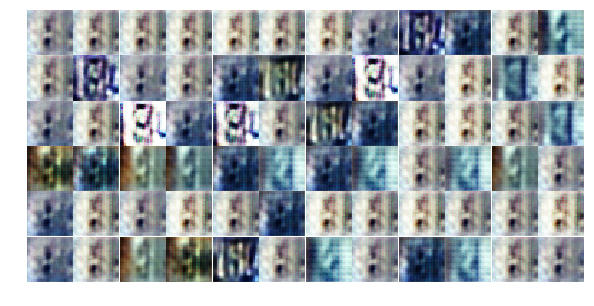

Epoch 6/10... Qfunction Loss: 6.075389862060547 Generator Loss: 8.349720001220703 Discriminator Loss: 0.15309937298297882
Epoch 6/10... Qfunction Loss: 7.829164505004883 Generator Loss: 8.456659317016602 Discriminator Loss: 0.12702764570713043
Epoch 6/10... Qfunction Loss: 5.617173194885254 Generator Loss: 8.071651458740234 Discriminator Loss: 0.09747666865587234
Epoch 6/10... Qfunction Loss: 4.025496482849121 Generator Loss: 10.122152328491211 Discriminator Loss: 0.06911035627126694
Epoch 6/10... Qfunction Loss: 3.3406381607055664 Generator Loss: 10.960287094116211 Discriminator Loss: 0.034753452986478806
Epoch 6/10... Qfunction Loss: 6.178577899932861 Generator Loss: 9.84382438659668 Discriminator Loss: 0.1076592355966568
Epoch 6/10... Qfunction Loss: 5.670126438140869 Generator Loss: 9.11099624633789 Discriminator Loss: 0.09805606305599213
Epoch 6/10... Qfunction Loss: 3.8248369693756104 Generator Loss: 9.617044448852539 Discriminator Loss: 0.04818413034081459
Epoch 6/10... Qfunctio

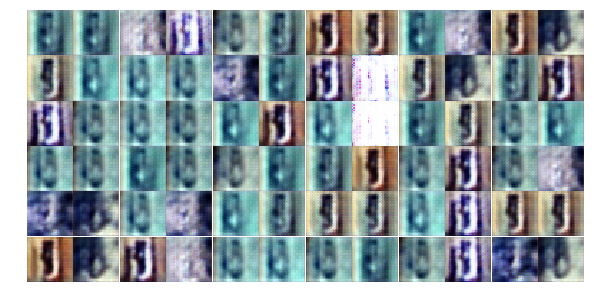

Epoch 6/10... Qfunction Loss: 7.881569862365723 Generator Loss: 10.403390884399414 Discriminator Loss: 2.6424317359924316
Epoch 6/10... Qfunction Loss: 6.663597106933594 Generator Loss: 6.407477378845215 Discriminator Loss: 0.22992411255836487
Epoch 6/10... Qfunction Loss: 4.864852428436279 Generator Loss: 6.550020694732666 Discriminator Loss: 0.41793662309646606
Epoch 6/10... Qfunction Loss: 3.3833248615264893 Generator Loss: 10.045839309692383 Discriminator Loss: 0.04802682250738144
Epoch 6/10... Qfunction Loss: 3.40789794921875 Generator Loss: 9.035663604736328 Discriminator Loss: 0.14481912553310394
Epoch 6/10... Qfunction Loss: 8.195564270019531 Generator Loss: 9.532432556152344 Discriminator Loss: 0.17947211861610413
Epoch 6/10... Qfunction Loss: 4.259730339050293 Generator Loss: 8.297975540161133 Discriminator Loss: 0.7792300581932068
Epoch 6/10... Qfunction Loss: 4.986430644989014 Generator Loss: 9.347845077514648 Discriminator Loss: 0.09608593583106995
Epoch 6/10... Qfunction 

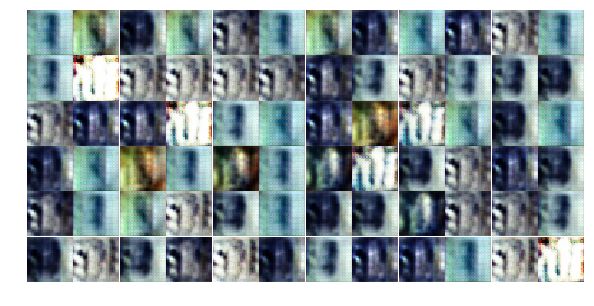

Epoch 6/10... Qfunction Loss: 3.067854881286621 Generator Loss: 7.969109535217285 Discriminator Loss: 0.14830085635185242
Epoch 6/10... Qfunction Loss: 6.471317291259766 Generator Loss: 6.771444797515869 Discriminator Loss: 0.138600692152977
Epoch 6/10... Qfunction Loss: 6.50169563293457 Generator Loss: 8.822013854980469 Discriminator Loss: 0.1386757493019104
Epoch 6/10... Qfunction Loss: 7.200056076049805 Generator Loss: 9.631094932556152 Discriminator Loss: 0.19180163741111755
Epoch 6/10... Qfunction Loss: 9.09347915649414 Generator Loss: 8.26154899597168 Discriminator Loss: 0.20130988955497742
Epoch 6/10... Qfunction Loss: 5.849282264709473 Generator Loss: 11.516593933105469 Discriminator Loss: 1.2352510690689087
Epoch 6/10... Qfunction Loss: 4.3528361320495605 Generator Loss: 7.890280723571777 Discriminator Loss: 0.36997708678245544
Epoch 6/10... Qfunction Loss: 4.185666561126709 Generator Loss: 8.31137466430664 Discriminator Loss: 0.16447687149047852
Epoch 6/10... Qfunction Loss: 

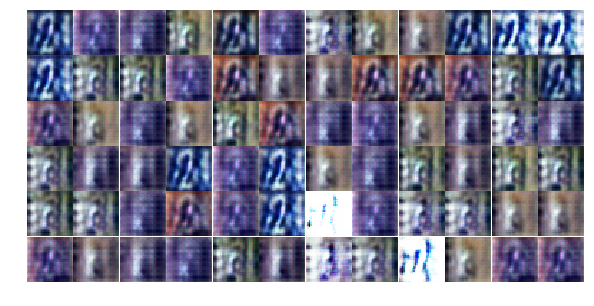

Epoch 6/10... Qfunction Loss: 2.179567337036133 Generator Loss: 7.878673553466797 Discriminator Loss: 0.1419874131679535
Epoch 6/10... Qfunction Loss: 7.675004482269287 Generator Loss: 8.730701446533203 Discriminator Loss: 0.09301799535751343
Epoch 6/10... Qfunction Loss: 5.709163665771484 Generator Loss: 7.596011161804199 Discriminator Loss: 0.12390520423650742
Epoch 6/10... Qfunction Loss: 7.5713090896606445 Generator Loss: 7.928791046142578 Discriminator Loss: 0.1552845537662506
Epoch 6/10... Qfunction Loss: 4.454268455505371 Generator Loss: 7.403820037841797 Discriminator Loss: 0.3121337890625
Epoch 6/10... Qfunction Loss: 3.965106964111328 Generator Loss: 8.224677085876465 Discriminator Loss: 0.4724865257740021
Epoch 6/10... Qfunction Loss: 6.726307392120361 Generator Loss: 8.34654426574707 Discriminator Loss: 0.2051854282617569
Epoch 6/10... Qfunction Loss: 8.936071395874023 Generator Loss: 10.41336727142334 Discriminator Loss: 0.1972588449716568
Epoch 6/10... Qfunction Loss: 9.2

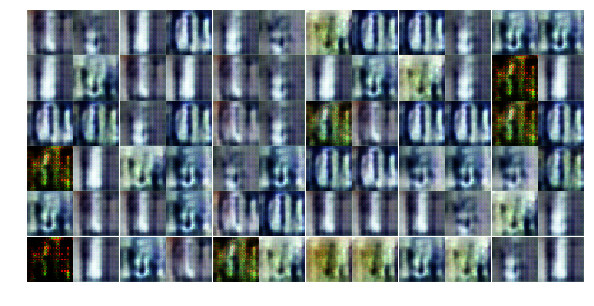

Epoch 6/10... Qfunction Loss: 5.7162604331970215 Generator Loss: 8.604415893554688 Discriminator Loss: 0.20261269807815552
Epoch 6/10... Qfunction Loss: 5.661367416381836 Generator Loss: 9.327853202819824 Discriminator Loss: 0.38768404722213745
Epoch 6/10... Qfunction Loss: 9.289154052734375 Generator Loss: 12.895401954650879 Discriminator Loss: 0.987101674079895
Epoch 6/10... Qfunction Loss: 3.653066635131836 Generator Loss: 9.28512954711914 Discriminator Loss: 0.12560272216796875
Epoch 6/10... Qfunction Loss: 3.2252960205078125 Generator Loss: 9.282978057861328 Discriminator Loss: 1.6510435342788696
Epoch 6/10... Qfunction Loss: 6.723866939544678 Generator Loss: 6.880031585693359 Discriminator Loss: 0.2408534586429596
Epoch 6/10... Qfunction Loss: 7.139357089996338 Generator Loss: 7.580632209777832 Discriminator Loss: 0.20789384841918945
Epoch 6/10... Qfunction Loss: 4.544296741485596 Generator Loss: 6.51864767074585 Discriminator Loss: 0.15879815816879272
Epoch 6/10... Qfunction Los

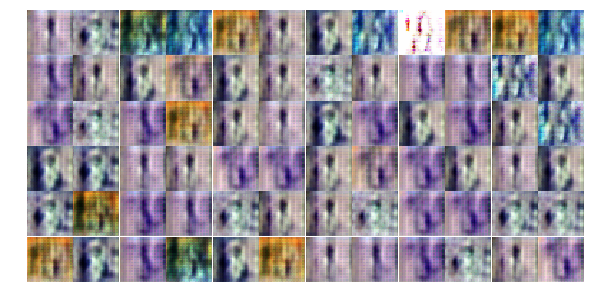

Epoch 6/10... Qfunction Loss: 7.66500997543335 Generator Loss: 6.758920669555664 Discriminator Loss: 0.4640846848487854
Epoch 6/10... Qfunction Loss: 5.174566268920898 Generator Loss: 8.531414031982422 Discriminator Loss: 0.371847540140152
Epoch 6/10... Qfunction Loss: 5.871621608734131 Generator Loss: 7.522155284881592 Discriminator Loss: 0.1412278115749359
Epoch 7/10... Qfunction Loss: 4.759818077087402 Generator Loss: 9.029754638671875 Discriminator Loss: 0.13301238417625427
Epoch 7/10... Qfunction Loss: 12.150113105773926 Generator Loss: 7.450355529785156 Discriminator Loss: 0.18833093345165253
Epoch 7/10... Qfunction Loss: 11.671662330627441 Generator Loss: 7.748953342437744 Discriminator Loss: 0.2840701937675476
Epoch 7/10... Qfunction Loss: 4.461801052093506 Generator Loss: 7.386956691741943 Discriminator Loss: 0.21210838854312897
Epoch 7/10... Qfunction Loss: 8.289984703063965 Generator Loss: 7.496564865112305 Discriminator Loss: 0.1783628761768341
Epoch 7/10... Qfunction Loss:

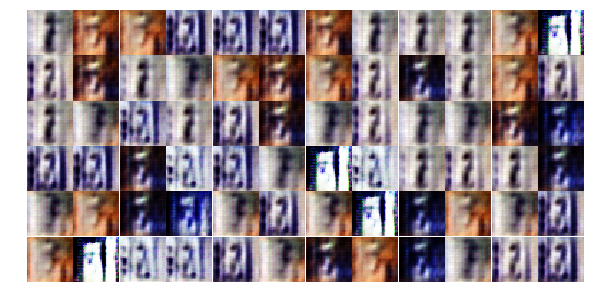

Epoch 7/10... Qfunction Loss: 4.257216453552246 Generator Loss: 9.395076751708984 Discriminator Loss: 0.08119632303714752
Epoch 7/10... Qfunction Loss: 6.991530418395996 Generator Loss: 9.78506851196289 Discriminator Loss: 0.5197121500968933
Epoch 7/10... Qfunction Loss: 6.236753463745117 Generator Loss: 10.129693984985352 Discriminator Loss: 0.7367321252822876
Epoch 7/10... Qfunction Loss: 8.185152053833008 Generator Loss: 10.062444686889648 Discriminator Loss: 0.1733075976371765
Epoch 7/10... Qfunction Loss: 7.528028964996338 Generator Loss: 7.571821212768555 Discriminator Loss: 0.24010087549686432
Epoch 7/10... Qfunction Loss: 3.6062533855438232 Generator Loss: 9.732524871826172 Discriminator Loss: 0.3883686065673828
Epoch 7/10... Qfunction Loss: 3.445781946182251 Generator Loss: 8.78965950012207 Discriminator Loss: 0.0922161340713501
Epoch 7/10... Qfunction Loss: 5.641200065612793 Generator Loss: 8.625032424926758 Discriminator Loss: 0.13256914913654327
Epoch 7/10... Qfunction Loss

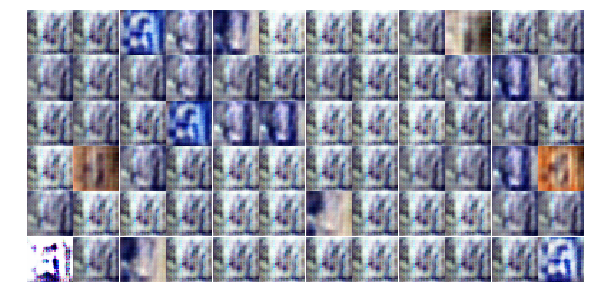

Epoch 7/10... Qfunction Loss: 4.448726654052734 Generator Loss: 11.124671936035156 Discriminator Loss: 1.1960701942443848
Epoch 7/10... Qfunction Loss: 7.567845821380615 Generator Loss: 8.015105247497559 Discriminator Loss: 0.10226693004369736
Epoch 7/10... Qfunction Loss: 8.072400093078613 Generator Loss: 10.268494606018066 Discriminator Loss: 1.0222128629684448
Epoch 7/10... Qfunction Loss: 3.8117761611938477 Generator Loss: 7.5927019119262695 Discriminator Loss: 0.16942568123340607
Epoch 7/10... Qfunction Loss: 8.450698852539062 Generator Loss: 8.520139694213867 Discriminator Loss: 0.09354954212903976
Epoch 7/10... Qfunction Loss: 5.564741134643555 Generator Loss: 9.248852729797363 Discriminator Loss: 0.15717488527297974
Epoch 7/10... Qfunction Loss: 2.9337339401245117 Generator Loss: 10.90620231628418 Discriminator Loss: 0.1867358684539795
Epoch 7/10... Qfunction Loss: 9.046560287475586 Generator Loss: 10.45390796661377 Discriminator Loss: 0.044630877673625946
Epoch 7/10... Qfuncti

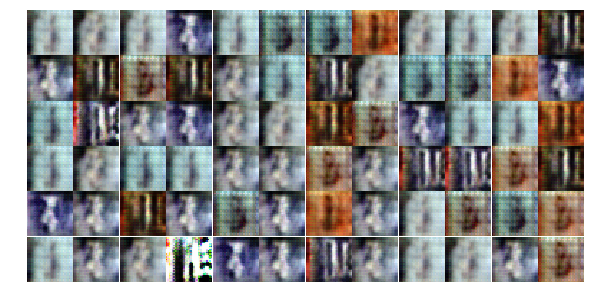

Epoch 7/10... Qfunction Loss: 8.368988037109375 Generator Loss: 9.842079162597656 Discriminator Loss: 0.06290432065725327
Epoch 7/10... Qfunction Loss: 4.594436168670654 Generator Loss: 9.868721008300781 Discriminator Loss: 0.0612066388130188
Epoch 7/10... Qfunction Loss: 5.415249347686768 Generator Loss: 11.375951766967773 Discriminator Loss: 0.41301020979881287
Epoch 7/10... Qfunction Loss: 5.770609378814697 Generator Loss: 9.236827850341797 Discriminator Loss: 0.9359764456748962
Epoch 7/10... Qfunction Loss: 8.792730331420898 Generator Loss: 7.990696907043457 Discriminator Loss: 0.6612111330032349
Epoch 7/10... Qfunction Loss: 4.494638919830322 Generator Loss: 8.557567596435547 Discriminator Loss: 0.07386913895606995
Epoch 7/10... Qfunction Loss: 8.121997833251953 Generator Loss: 7.740586757659912 Discriminator Loss: 0.15759307146072388
Epoch 7/10... Qfunction Loss: 4.1998114585876465 Generator Loss: 9.986574172973633 Discriminator Loss: 0.058798808604478836
Epoch 7/10... Qfunction 

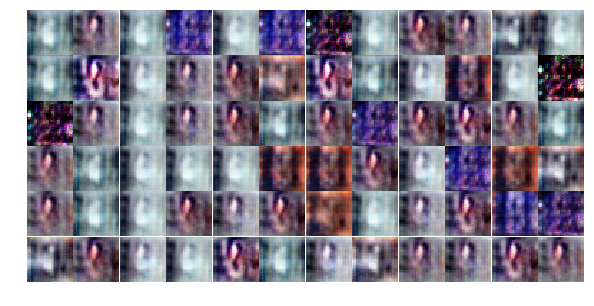

Epoch 7/10... Qfunction Loss: 6.151469707489014 Generator Loss: 11.626201629638672 Discriminator Loss: 0.02579864114522934
Epoch 7/10... Qfunction Loss: 8.54638385772705 Generator Loss: 12.806829452514648 Discriminator Loss: 1.0851085186004639
Epoch 7/10... Qfunction Loss: 5.331966400146484 Generator Loss: 11.24124813079834 Discriminator Loss: 0.033126235008239746
Epoch 7/10... Qfunction Loss: 13.769233703613281 Generator Loss: 10.60448169708252 Discriminator Loss: 0.06805163621902466
Epoch 7/10... Qfunction Loss: 7.542061805725098 Generator Loss: 12.488460540771484 Discriminator Loss: 1.9238860607147217
Epoch 7/10... Qfunction Loss: 6.278812408447266 Generator Loss: 9.029192924499512 Discriminator Loss: 0.42502361536026
Epoch 7/10... Qfunction Loss: 3.547333002090454 Generator Loss: 8.980984687805176 Discriminator Loss: 0.06788240373134613
Epoch 7/10... Qfunction Loss: 5.9080681800842285 Generator Loss: 11.698549270629883 Discriminator Loss: 0.2873461842536926
Epoch 7/10... Qfunction 

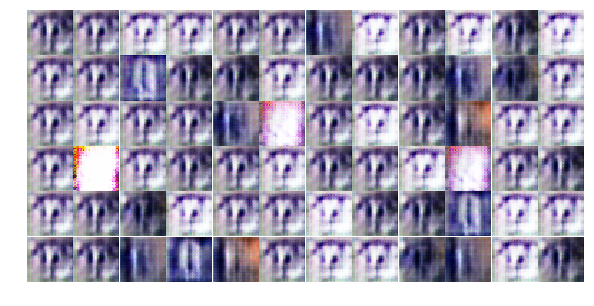

Epoch 7/10... Qfunction Loss: 6.603448867797852 Generator Loss: 8.195711135864258 Discriminator Loss: 0.10841058939695358
Epoch 7/10... Qfunction Loss: 7.7635698318481445 Generator Loss: 9.519718170166016 Discriminator Loss: 0.2261243313550949
Epoch 7/10... Qfunction Loss: 4.685915946960449 Generator Loss: 8.009758949279785 Discriminator Loss: 0.1268397867679596
Epoch 7/10... Qfunction Loss: 6.960723876953125 Generator Loss: 7.382987976074219 Discriminator Loss: 0.3695821464061737
Epoch 7/10... Qfunction Loss: 12.383298873901367 Generator Loss: 8.693170547485352 Discriminator Loss: 0.07540078461170197
Epoch 7/10... Qfunction Loss: 4.293332099914551 Generator Loss: 12.297439575195312 Discriminator Loss: 0.08924303948879242
Epoch 7/10... Qfunction Loss: 11.547945022583008 Generator Loss: 10.56287670135498 Discriminator Loss: 0.2518365681171417
Epoch 7/10... Qfunction Loss: 4.240203857421875 Generator Loss: 8.530298233032227 Discriminator Loss: 0.09894566237926483
Epoch 7/10... Qfunction 

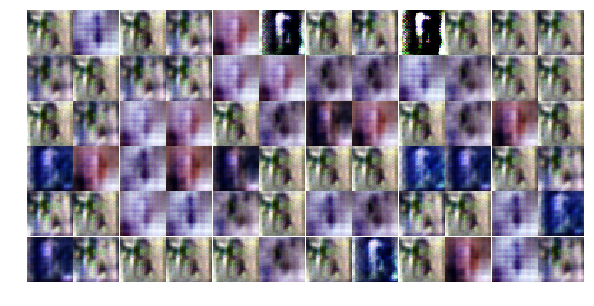

Epoch 7/10... Qfunction Loss: 4.8670806884765625 Generator Loss: 10.080798149108887 Discriminator Loss: 0.07995641231536865
Epoch 8/10... Qfunction Loss: 7.6578288078308105 Generator Loss: 10.228440284729004 Discriminator Loss: 0.2547483444213867
Epoch 8/10... Qfunction Loss: 7.127427101135254 Generator Loss: 11.992193222045898 Discriminator Loss: 0.13353672623634338
Epoch 8/10... Qfunction Loss: 6.773156642913818 Generator Loss: 10.181065559387207 Discriminator Loss: 0.10412627458572388
Epoch 8/10... Qfunction Loss: 9.065593719482422 Generator Loss: 10.88892650604248 Discriminator Loss: 0.04716239869594574
Epoch 8/10... Qfunction Loss: 8.719497680664062 Generator Loss: 8.044170379638672 Discriminator Loss: 0.125980406999588
Epoch 8/10... Qfunction Loss: 7.075802803039551 Generator Loss: 8.028860092163086 Discriminator Loss: 0.07962990552186966
Epoch 8/10... Qfunction Loss: 5.070074081420898 Generator Loss: 8.017566680908203 Discriminator Loss: 0.2199636995792389
Epoch 8/10... Qfunctio

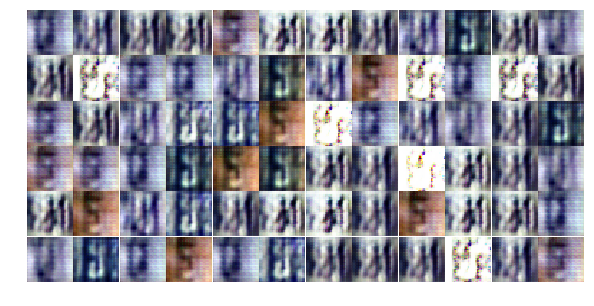

Epoch 8/10... Qfunction Loss: 7.801499366760254 Generator Loss: 9.546709060668945 Discriminator Loss: 0.18551760911941528
Epoch 8/10... Qfunction Loss: 8.403128623962402 Generator Loss: 11.718753814697266 Discriminator Loss: 0.21241886913776398
Epoch 8/10... Qfunction Loss: 4.918264865875244 Generator Loss: 9.697084426879883 Discriminator Loss: 0.3910213112831116
Epoch 8/10... Qfunction Loss: 7.988986015319824 Generator Loss: 8.785867691040039 Discriminator Loss: 0.14667178690433502
Epoch 8/10... Qfunction Loss: 4.294215202331543 Generator Loss: 8.499405860900879 Discriminator Loss: 0.17131051421165466
Epoch 8/10... Qfunction Loss: 5.172619819641113 Generator Loss: 8.513864517211914 Discriminator Loss: 0.2052919715642929
Epoch 8/10... Qfunction Loss: 8.160088539123535 Generator Loss: 9.555206298828125 Discriminator Loss: 0.07164893299341202
Epoch 8/10... Qfunction Loss: 8.692235946655273 Generator Loss: 9.334966659545898 Discriminator Loss: 0.060223862528800964
Epoch 8/10... Qfunction 

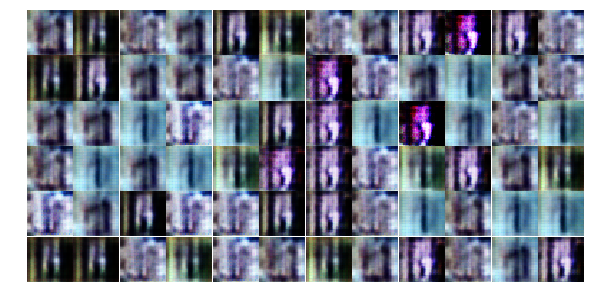

Epoch 8/10... Qfunction Loss: 3.887425184249878 Generator Loss: 9.99995231628418 Discriminator Loss: 0.05664978176355362
Epoch 8/10... Qfunction Loss: 6.623987674713135 Generator Loss: 11.231609344482422 Discriminator Loss: 0.024725398048758507
Epoch 8/10... Qfunction Loss: 5.8848161697387695 Generator Loss: 9.500236511230469 Discriminator Loss: 0.04513239115476608
Epoch 8/10... Qfunction Loss: 5.50847053527832 Generator Loss: 9.699440002441406 Discriminator Loss: 0.14679443836212158
Epoch 8/10... Qfunction Loss: 10.740034103393555 Generator Loss: 11.574928283691406 Discriminator Loss: 0.21839539706707
Epoch 8/10... Qfunction Loss: 5.423117637634277 Generator Loss: 9.967752456665039 Discriminator Loss: 0.040385566651821136
Epoch 8/10... Qfunction Loss: 7.130009651184082 Generator Loss: 8.845890998840332 Discriminator Loss: 0.22385263442993164
Epoch 8/10... Qfunction Loss: 8.788572311401367 Generator Loss: 10.494049072265625 Discriminator Loss: 0.14603140950202942
Epoch 8/10... Qfunctio

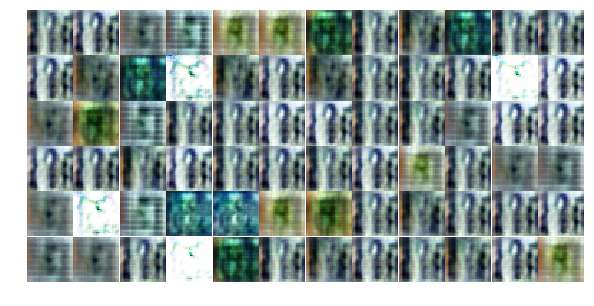

Epoch 8/10... Qfunction Loss: 4.80100679397583 Generator Loss: 9.575384140014648 Discriminator Loss: 0.10654730349779129
Epoch 8/10... Qfunction Loss: 9.878314971923828 Generator Loss: 9.928596496582031 Discriminator Loss: 0.08753462135791779
Epoch 8/10... Qfunction Loss: 5.08666467666626 Generator Loss: 10.092582702636719 Discriminator Loss: 0.1289089173078537
Epoch 8/10... Qfunction Loss: 9.26021957397461 Generator Loss: 9.83835506439209 Discriminator Loss: 0.41032499074935913
Epoch 8/10... Qfunction Loss: 2.956101655960083 Generator Loss: 11.86555004119873 Discriminator Loss: 0.14010557532310486
Epoch 8/10... Qfunction Loss: 7.979100227355957 Generator Loss: 13.235459327697754 Discriminator Loss: 0.046309467405080795
Epoch 8/10... Qfunction Loss: 5.761532783508301 Generator Loss: 9.041519165039062 Discriminator Loss: 0.14390891790390015
Epoch 8/10... Qfunction Loss: 6.092438697814941 Generator Loss: 8.13125228881836 Discriminator Loss: 0.14387600123882294
Epoch 8/10... Qfunction Los

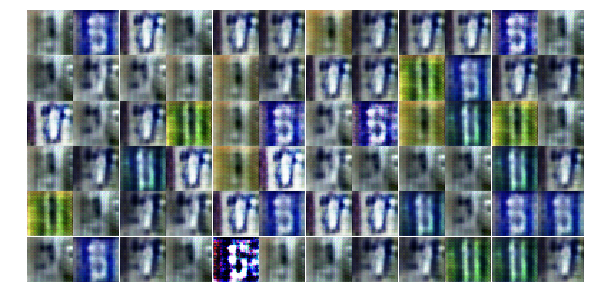

Epoch 8/10... Qfunction Loss: 5.168384552001953 Generator Loss: 14.11600399017334 Discriminator Loss: 0.10559557378292084
Epoch 8/10... Qfunction Loss: 5.413166522979736 Generator Loss: 9.626418113708496 Discriminator Loss: 0.5027744174003601
Epoch 8/10... Qfunction Loss: 10.860932350158691 Generator Loss: 9.046637535095215 Discriminator Loss: 0.07143160700798035
Epoch 8/10... Qfunction Loss: 6.1965203285217285 Generator Loss: 9.274524688720703 Discriminator Loss: 0.12700863182544708
Epoch 8/10... Qfunction Loss: 4.832049369812012 Generator Loss: 12.75289249420166 Discriminator Loss: 0.16251227259635925
Epoch 8/10... Qfunction Loss: 7.474841117858887 Generator Loss: 11.26713752746582 Discriminator Loss: 0.05066177248954773
Epoch 8/10... Qfunction Loss: 5.309765815734863 Generator Loss: 10.599329948425293 Discriminator Loss: 1.9960583448410034
Epoch 8/10... Qfunction Loss: 10.244972229003906 Generator Loss: 10.952617645263672 Discriminator Loss: 0.09618926048278809
Epoch 8/10... Qfuncti

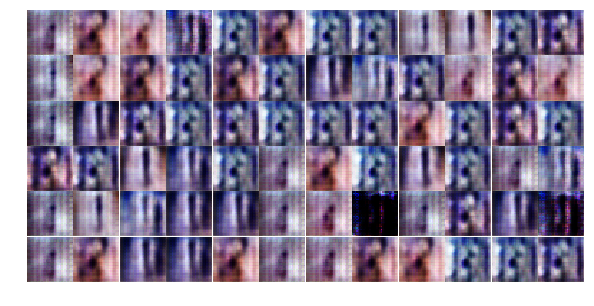

Epoch 8/10... Qfunction Loss: 5.249425888061523 Generator Loss: 7.732619285583496 Discriminator Loss: 0.1332552582025528
Epoch 8/10... Qfunction Loss: 7.781399250030518 Generator Loss: 8.385244369506836 Discriminator Loss: 0.08707387745380402
Epoch 8/10... Qfunction Loss: 6.336439609527588 Generator Loss: 9.08546257019043 Discriminator Loss: 0.10256673395633698
Epoch 8/10... Qfunction Loss: 10.470781326293945 Generator Loss: 7.956752300262451 Discriminator Loss: 0.16090527176856995
Epoch 8/10... Qfunction Loss: 4.311732292175293 Generator Loss: 8.353659629821777 Discriminator Loss: 0.10164026916027069
Epoch 8/10... Qfunction Loss: 9.174941062927246 Generator Loss: 8.778487205505371 Discriminator Loss: 0.16525590419769287
Epoch 8/10... Qfunction Loss: 10.784417152404785 Generator Loss: 9.495691299438477 Discriminator Loss: 0.06728088855743408
Epoch 8/10... Qfunction Loss: 9.076545715332031 Generator Loss: 7.9219651222229 Discriminator Loss: 0.12829312682151794
Epoch 9/10... Qfunction Lo

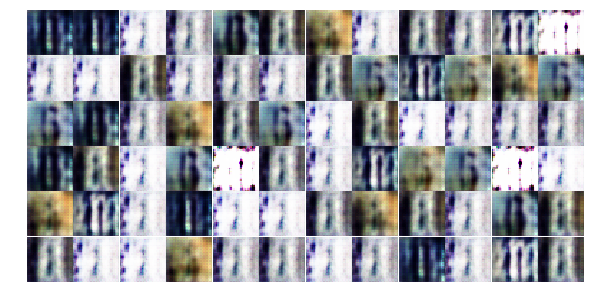

Epoch 9/10... Qfunction Loss: 6.954079627990723 Generator Loss: 11.87572193145752 Discriminator Loss: 0.2890317440032959
Epoch 9/10... Qfunction Loss: 11.794351577758789 Generator Loss: 10.325839042663574 Discriminator Loss: 0.05659494549036026
Epoch 9/10... Qfunction Loss: 8.930108070373535 Generator Loss: 8.360908508300781 Discriminator Loss: 0.1281493753194809
Epoch 9/10... Qfunction Loss: 8.896306991577148 Generator Loss: 9.324230194091797 Discriminator Loss: 0.04426269233226776
Epoch 9/10... Qfunction Loss: 5.334238052368164 Generator Loss: 9.65677261352539 Discriminator Loss: 0.06884366273880005
Epoch 9/10... Qfunction Loss: 6.1652421951293945 Generator Loss: 10.48000717163086 Discriminator Loss: 0.02876349166035652
Epoch 9/10... Qfunction Loss: 4.832525253295898 Generator Loss: 13.357611656188965 Discriminator Loss: 0.03146664425730705
Epoch 9/10... Qfunction Loss: 3.9399187564849854 Generator Loss: 10.895435333251953 Discriminator Loss: 0.040338173508644104
Epoch 9/10... Qfunct

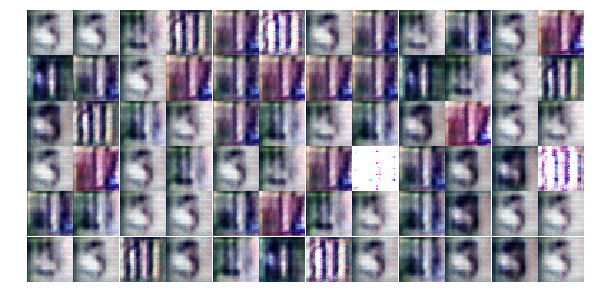

Epoch 9/10... Qfunction Loss: 6.167940139770508 Generator Loss: 9.888587951660156 Discriminator Loss: 0.034164801239967346
Epoch 9/10... Qfunction Loss: 8.031596183776855 Generator Loss: 12.295700073242188 Discriminator Loss: 0.039349187165498734
Epoch 9/10... Qfunction Loss: 5.853664875030518 Generator Loss: 11.618032455444336 Discriminator Loss: 1.5896449089050293
Epoch 9/10... Qfunction Loss: 12.179075241088867 Generator Loss: 7.859409332275391 Discriminator Loss: 0.11783124506473541
Epoch 9/10... Qfunction Loss: 4.040285110473633 Generator Loss: 9.872566223144531 Discriminator Loss: 0.11190464347600937
Epoch 9/10... Qfunction Loss: 4.422484397888184 Generator Loss: 8.203521728515625 Discriminator Loss: 0.0844370499253273
Epoch 9/10... Qfunction Loss: 8.378517150878906 Generator Loss: 9.905557632446289 Discriminator Loss: 0.1453031301498413
Epoch 9/10... Qfunction Loss: 4.2624382972717285 Generator Loss: 10.912468910217285 Discriminator Loss: 0.4578952193260193
Epoch 9/10... Qfuncti

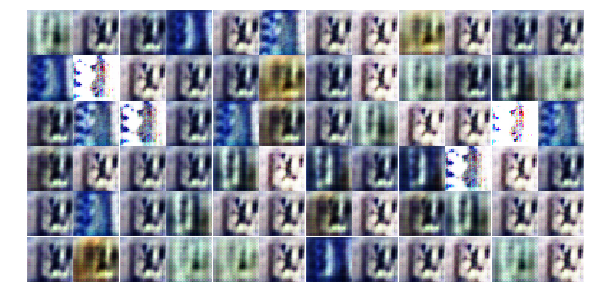

Epoch 9/10... Qfunction Loss: 8.213590621948242 Generator Loss: 12.117270469665527 Discriminator Loss: 0.02132386900484562
Epoch 9/10... Qfunction Loss: 5.6946611404418945 Generator Loss: 12.365310668945312 Discriminator Loss: 0.10045252740383148
Epoch 9/10... Qfunction Loss: 8.603572845458984 Generator Loss: 10.017204284667969 Discriminator Loss: 0.14054863154888153
Epoch 9/10... Qfunction Loss: 7.434211254119873 Generator Loss: 7.546533584594727 Discriminator Loss: 0.1535704880952835
Epoch 9/10... Qfunction Loss: 5.949714183807373 Generator Loss: 10.096525192260742 Discriminator Loss: 0.11151308566331863
Epoch 9/10... Qfunction Loss: 3.7538692951202393 Generator Loss: 12.657445907592773 Discriminator Loss: 0.025233762338757515
Epoch 9/10... Qfunction Loss: 13.044281959533691 Generator Loss: 9.204096794128418 Discriminator Loss: 0.06663146615028381
Epoch 9/10... Qfunction Loss: 6.423467636108398 Generator Loss: 8.942834854125977 Discriminator Loss: 0.09759827703237534
Epoch 9/10... Qf

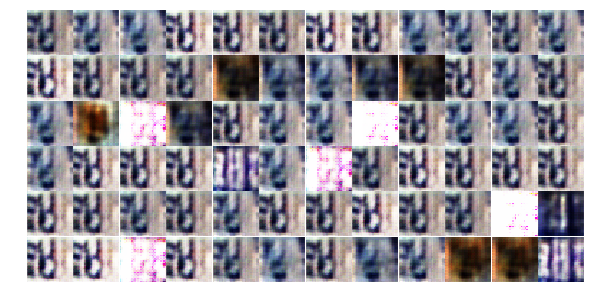

Epoch 9/10... Qfunction Loss: 8.138981819152832 Generator Loss: 11.070412635803223 Discriminator Loss: 0.2198997139930725
Epoch 9/10... Qfunction Loss: 4.9672040939331055 Generator Loss: 11.466964721679688 Discriminator Loss: 0.2378259301185608
Epoch 9/10... Qfunction Loss: 7.369635105133057 Generator Loss: 9.45562744140625 Discriminator Loss: 0.2486134171485901
Epoch 9/10... Qfunction Loss: 9.490936279296875 Generator Loss: 9.743020057678223 Discriminator Loss: 0.08000056445598602
Epoch 9/10... Qfunction Loss: 9.900670051574707 Generator Loss: 9.466817855834961 Discriminator Loss: 0.29468411207199097
Epoch 9/10... Qfunction Loss: 6.462622165679932 Generator Loss: 9.730424880981445 Discriminator Loss: 0.44900649785995483
Epoch 9/10... Qfunction Loss: 4.926482200622559 Generator Loss: 13.11267375946045 Discriminator Loss: 0.9530794024467468
Epoch 9/10... Qfunction Loss: 2.6960713863372803 Generator Loss: 8.323545455932617 Discriminator Loss: 0.11091844737529755
Epoch 9/10... Qfunction L

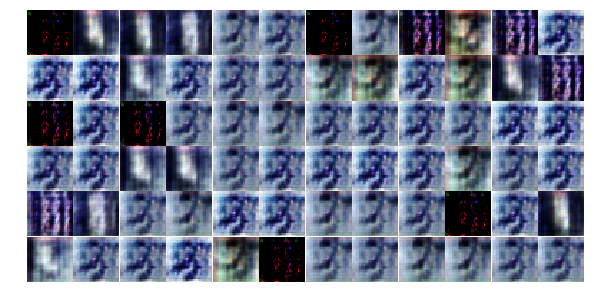

Epoch 9/10... Qfunction Loss: 7.272947311401367 Generator Loss: 11.143914222717285 Discriminator Loss: 0.08847334235906601
Epoch 9/10... Qfunction Loss: 9.773577690124512 Generator Loss: 11.467449188232422 Discriminator Loss: 0.037966758012771606
Epoch 9/10... Qfunction Loss: 11.5285005569458 Generator Loss: 10.017868995666504 Discriminator Loss: 0.04686008766293526
Epoch 9/10... Qfunction Loss: 6.950538158416748 Generator Loss: 8.779708862304688 Discriminator Loss: 0.09448499977588654
Epoch 9/10... Qfunction Loss: 9.05052661895752 Generator Loss: 10.615355491638184 Discriminator Loss: 0.05321718752384186
Epoch 9/10... Qfunction Loss: 11.054800987243652 Generator Loss: 10.831815719604492 Discriminator Loss: 0.0617833286523819
Epoch 9/10... Qfunction Loss: 14.558725357055664 Generator Loss: 11.306527137756348 Discriminator Loss: 0.07750499993562698
Epoch 9/10... Qfunction Loss: 13.537781715393066 Generator Loss: 9.002326965332031 Discriminator Loss: 0.43243327736854553
Epoch 9/10... Qfu

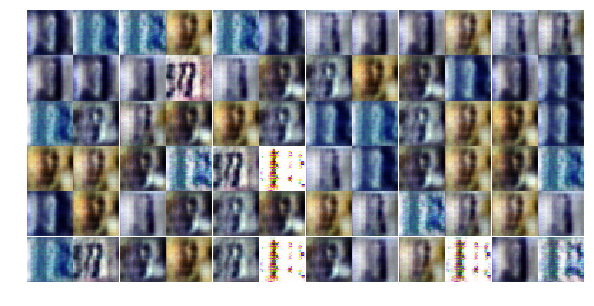

Epoch 9/10... Qfunction Loss: 11.488790512084961 Generator Loss: 9.81472396850586 Discriminator Loss: 0.07832567393779755
Epoch 9/10... Qfunction Loss: 5.69996452331543 Generator Loss: 10.60389232635498 Discriminator Loss: 0.06319765001535416
Epoch 9/10... Qfunction Loss: 8.422744750976562 Generator Loss: 10.36279296875 Discriminator Loss: 0.050287876278162
Epoch 9/10... Qfunction Loss: 3.5530858039855957 Generator Loss: 12.107925415039062 Discriminator Loss: 0.019692765548825264
Epoch 9/10... Qfunction Loss: 16.8687686920166 Generator Loss: 9.990520477294922 Discriminator Loss: 0.12517598271369934
Epoch 10/10... Qfunction Loss: 4.595975399017334 Generator Loss: 11.695074081420898 Discriminator Loss: 0.09657716006040573
Epoch 10/10... Qfunction Loss: 9.161528587341309 Generator Loss: 11.643549919128418 Discriminator Loss: 0.026863785460591316
Epoch 10/10... Qfunction Loss: 11.079690933227539 Generator Loss: 13.013603210449219 Discriminator Loss: 0.10207927227020264
Epoch 10/10... Qfunc

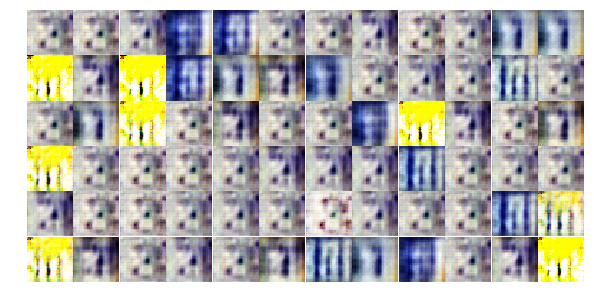

Epoch 10/10... Qfunction Loss: 6.782744884490967 Generator Loss: 7.201605796813965 Discriminator Loss: 0.22141432762145996
Epoch 10/10... Qfunction Loss: 7.449896812438965 Generator Loss: 10.15371036529541 Discriminator Loss: 0.22473058104515076
Epoch 10/10... Qfunction Loss: 5.288853645324707 Generator Loss: 9.852581024169922 Discriminator Loss: 0.05000932514667511
Epoch 10/10... Qfunction Loss: 4.133576393127441 Generator Loss: 9.99458122253418 Discriminator Loss: 0.05781583487987518
Epoch 10/10... Qfunction Loss: 10.380149841308594 Generator Loss: 11.538108825683594 Discriminator Loss: 0.040506377816200256
Epoch 10/10... Qfunction Loss: 7.870314598083496 Generator Loss: 9.953847885131836 Discriminator Loss: 0.05655975639820099
Epoch 10/10... Qfunction Loss: 5.049173831939697 Generator Loss: 9.56894302368164 Discriminator Loss: 0.078233502805233
Epoch 10/10... Qfunction Loss: 11.509977340698242 Generator Loss: 9.266448974609375 Discriminator Loss: 0.15339592099189758
Epoch 10/10... Q

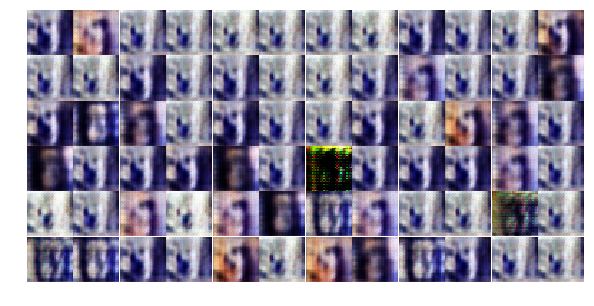

Epoch 10/10... Qfunction Loss: 11.164627075195312 Generator Loss: 9.652593612670898 Discriminator Loss: 0.09116166085004807
Epoch 10/10... Qfunction Loss: 10.597453117370605 Generator Loss: 10.258746147155762 Discriminator Loss: 0.09575480967760086
Epoch 10/10... Qfunction Loss: 9.074117660522461 Generator Loss: 9.461047172546387 Discriminator Loss: 0.07113394141197205
Epoch 10/10... Qfunction Loss: 13.113199234008789 Generator Loss: 10.962118148803711 Discriminator Loss: 0.05192781239748001
Epoch 10/10... Qfunction Loss: 5.318971157073975 Generator Loss: 9.473295211791992 Discriminator Loss: 0.10987760871648788
Epoch 10/10... Qfunction Loss: 9.645038604736328 Generator Loss: 10.901432037353516 Discriminator Loss: 0.0375407412648201
Epoch 10/10... Qfunction Loss: 8.600513458251953 Generator Loss: 10.479907989501953 Discriminator Loss: 0.04428335651755333
Epoch 10/10... Qfunction Loss: 10.465337753295898 Generator Loss: 11.405067443847656 Discriminator Loss: 0.037336334586143494
Epoch 1

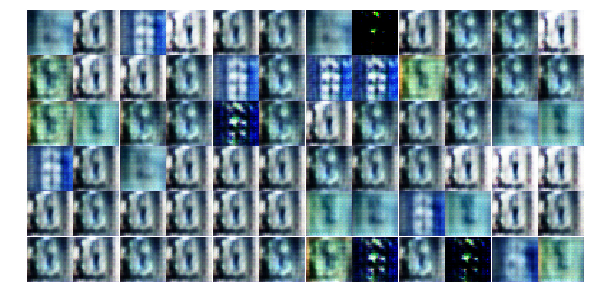

Epoch 10/10... Qfunction Loss: 9.557293891906738 Generator Loss: 14.9075288772583 Discriminator Loss: 0.13081911206245422
Epoch 10/10... Qfunction Loss: 4.599763870239258 Generator Loss: 9.705022811889648 Discriminator Loss: 0.05021144449710846
Epoch 10/10... Qfunction Loss: 12.636433601379395 Generator Loss: 11.690476417541504 Discriminator Loss: 0.016644317656755447
Epoch 10/10... Qfunction Loss: 7.17717170715332 Generator Loss: 11.599637031555176 Discriminator Loss: 0.026001540943980217
Epoch 10/10... Qfunction Loss: 5.467259407043457 Generator Loss: 12.238059997558594 Discriminator Loss: 0.020582551136612892
Epoch 10/10... Qfunction Loss: 3.3449485301971436 Generator Loss: 9.226049423217773 Discriminator Loss: 0.10029225796461105
Epoch 10/10... Qfunction Loss: 4.317939758300781 Generator Loss: 16.808061599731445 Discriminator Loss: 0.011611461639404297
Epoch 10/10... Qfunction Loss: 9.950672149658203 Generator Loss: 9.725763320922852 Discriminator Loss: 0.04208783805370331
Epoch 10

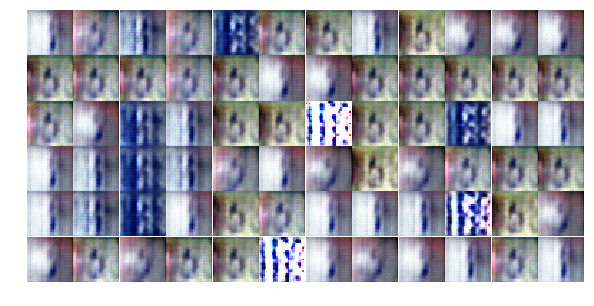

Epoch 10/10... Qfunction Loss: 9.580240249633789 Generator Loss: 9.653627395629883 Discriminator Loss: 0.13130107522010803
Epoch 10/10... Qfunction Loss: 7.045749664306641 Generator Loss: 10.852882385253906 Discriminator Loss: 0.09675426036119461
Epoch 10/10... Qfunction Loss: 4.283466815948486 Generator Loss: 9.047269821166992 Discriminator Loss: 0.1743975281715393
Epoch 10/10... Qfunction Loss: 10.515589714050293 Generator Loss: 16.59607696533203 Discriminator Loss: 0.16001757979393005
Epoch 10/10... Qfunction Loss: 8.533548355102539 Generator Loss: 9.203022003173828 Discriminator Loss: 0.2195378690958023
Epoch 10/10... Qfunction Loss: 14.145614624023438 Generator Loss: 10.872556686401367 Discriminator Loss: 0.04499945789575577
Epoch 10/10... Qfunction Loss: 10.142477989196777 Generator Loss: 12.516704559326172 Discriminator Loss: 0.014559291303157806
Epoch 10/10... Qfunction Loss: 9.401948928833008 Generator Loss: 14.660083770751953 Discriminator Loss: 0.04399513453245163
Epoch 10/1

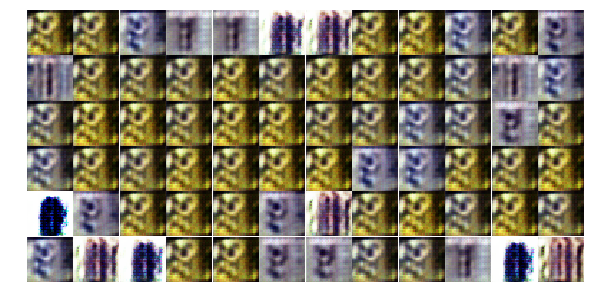

Epoch 10/10... Qfunction Loss: 11.325125694274902 Generator Loss: 11.942631721496582 Discriminator Loss: 0.03007572516798973
Epoch 10/10... Qfunction Loss: 6.674971580505371 Generator Loss: 19.954204559326172 Discriminator Loss: 0.00403515063226223
Epoch 10/10... Qfunction Loss: 13.24704360961914 Generator Loss: 15.70645809173584 Discriminator Loss: 1.0396796464920044
Epoch 10/10... Qfunction Loss: 8.14409351348877 Generator Loss: 12.182758331298828 Discriminator Loss: 0.018487634137272835
Epoch 10/10... Qfunction Loss: 4.569610595703125 Generator Loss: 9.643363952636719 Discriminator Loss: 0.09234075248241425
Epoch 10/10... Qfunction Loss: 4.145269393920898 Generator Loss: 12.332015991210938 Discriminator Loss: 0.11897158622741699
Epoch 10/10... Qfunction Loss: 15.610832214355469 Generator Loss: 10.326162338256836 Discriminator Loss: 0.04114864021539688
Epoch 10/10... Qfunction Loss: 9.335009574890137 Generator Loss: 10.167354583740234 Discriminator Loss: 0.04082237184047699
Epoch 10/

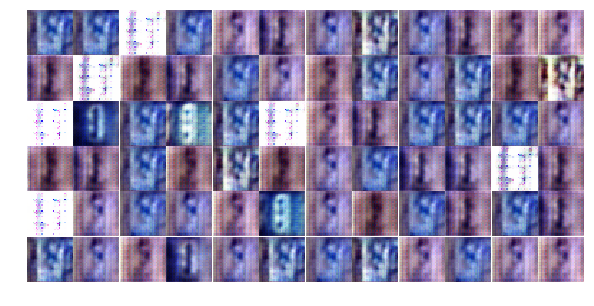

Epoch 10/10... Qfunction Loss: 6.84565544128418 Generator Loss: 13.099350929260254 Discriminator Loss: 0.02719813399016857
Epoch 10/10... Qfunction Loss: 10.000036239624023 Generator Loss: 11.46183967590332 Discriminator Loss: 0.09290581196546555
Epoch 10/10... Qfunction Loss: 3.6007423400878906 Generator Loss: 14.974557876586914 Discriminator Loss: 0.012293082661926746


In [61]:
losses, samples = train(model=model, dataset=dataset, epochs=epochs, batch_size=batch_size, figsize=(10,5))

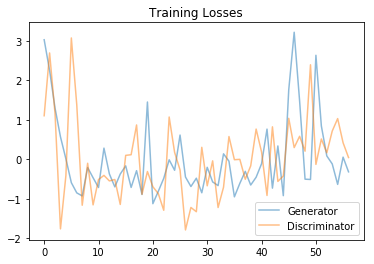

In [47]:
fig, ax = plt.subplots()
losses_ = np.array(losses)
losses_norm = (losses_ - losses_.mean(axis=0))/losses_.std(axis=0)
# print(losses_.shape, losses_norm.shape, losses_norm.dtype, losses_norm.dtype)
plt.plot(losses_norm.T[0], label='Generator', alpha=0.5)
plt.plot(losses_norm.T[1], label='Discriminator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

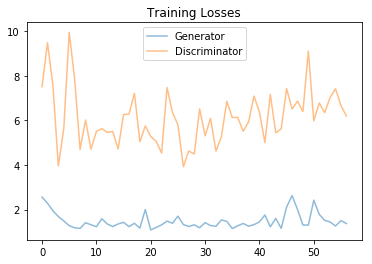

In [48]:
fig, ax = plt.subplots()
losses_ = np.array(losses)
plt.plot(losses_.T[0], label='Generator', alpha=0.5)
plt.plot(losses_.T[1], label='Discriminator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


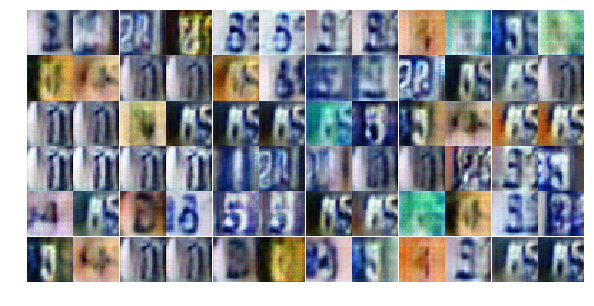

In [51]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

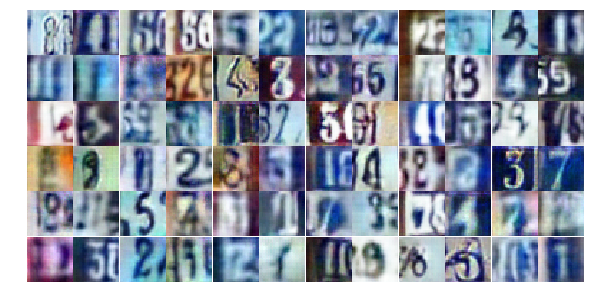

In [19]:
# Standard DCGAN
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))